# Results Exploration — Stock Price Forecasting (Hybrid CNN–LSTM)

This notebook contains the results analysis and visualization pipeline used to generate the figures and tables referenced in the project README: closing price trends, feature correlation analysis, SHAP-based feature importance, and model comparison (LSTM vs. CNN vs. proposed hybrid CNN–LSTM).

> Note: this notebook covers analysis and visualization only. Model training/architecture code is not included in this repository.


## Setup

In [1]:
import os
import json
import glob
from collections import Counter

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from IPython.display import display, Image
import warnings
warnings.filterwarnings("ignore")


DATA_DIR = "data"
RESULTS_DIR = "results"
PLOTS_DIR = "plots"
os.makedirs(PLOTS_DIR, exist_ok=True)


def fix_sentiment_score(df):
    """Collapse pos/neg/neu sentiment probability columns into a single
    categorical sentiment_score column (+1 / -1 / 0)."""
    sentiment_cols = ['pos', 'neg', 'neu']
    if all(col in df.columns for col in sentiment_cols):
        def compute_score(row):
            scores = [row['pos'], row['neg'], row['neu']]
            if all(score == 0 for score in scores):
                return 0
            return [1, -1, 0][scores.index(max(scores))]

        df['sentiment_score'] = df.apply(compute_score, axis=1)
        df.drop(columns=sentiment_cols, inplace=True)
    return df


# --- Unified plot styling (applied globally) ---
sns.set_theme(style="whitegrid", font_scale=1.05)
plt.rcParams.update({
    "figure.dpi": 120,
    "savefig.dpi": 150,
    "axes.spines.top": False,
    "axes.spines.right": False,
    "axes.titlesize": 14,
    "axes.titleweight": "bold",
    "axes.labelsize": 11,
    "figure.facecolor": "white",
    "savefig.facecolor": "white",
})

PALETTE = {
    "primary": "#2E5EAA",      # steel blue — default single-series color
    "positive": "#2E7D32",     # green — positive correlation / good
    "negative": "#C62828",     # red — negative correlation / poor
    "accent": "#6A4C93",       # purple — secondary series
    "models": {"LSTM": "#C62828", "CNN": "#F9A825", "CNN-LSTM": "#2E7D32", "Proposed CNN-LSTM": "#2E7D32"},
}


## 1. Closing Price Visualization

Plots each ticker's adjusted closing price over the full historical range, from 2018 onward.

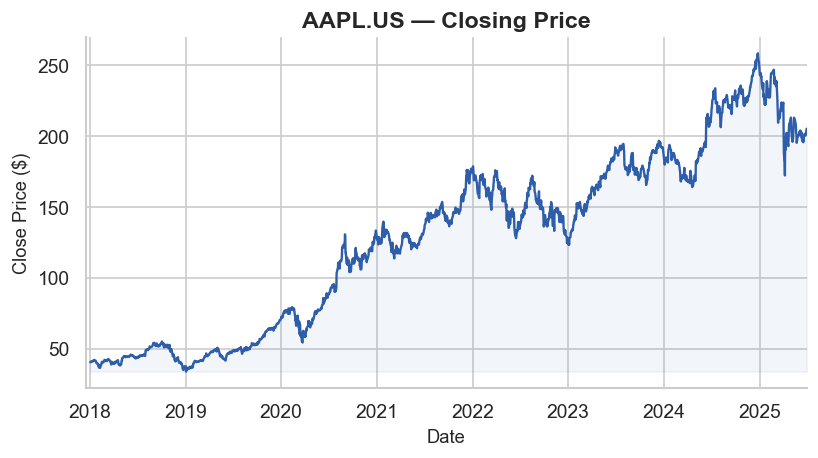

AAPL.US: interactive view shown above; static PNG saved for GitHub display


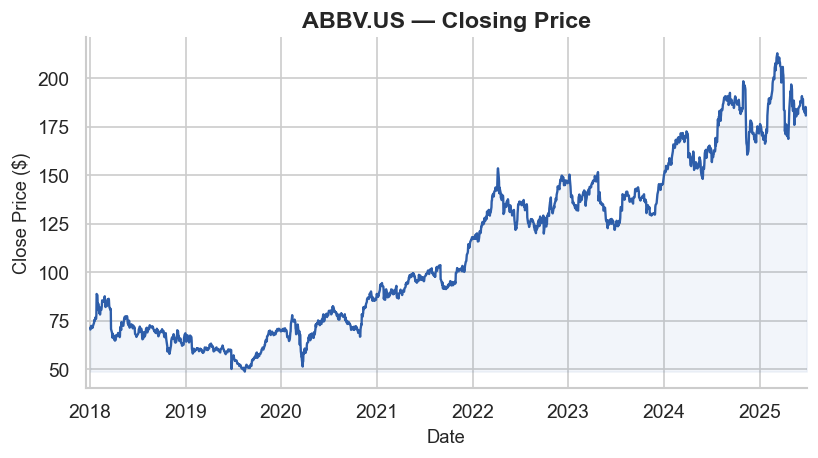

ABBV.US: interactive view shown above; static PNG saved for GitHub display


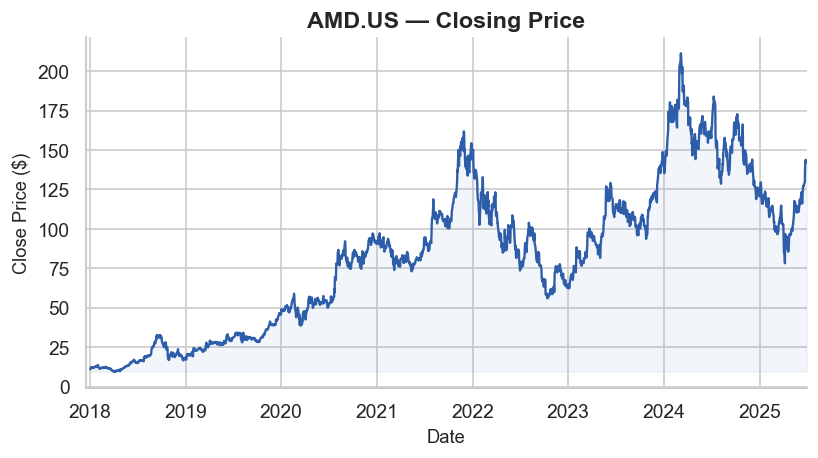

AMD.US: interactive view shown above; static PNG saved for GitHub display


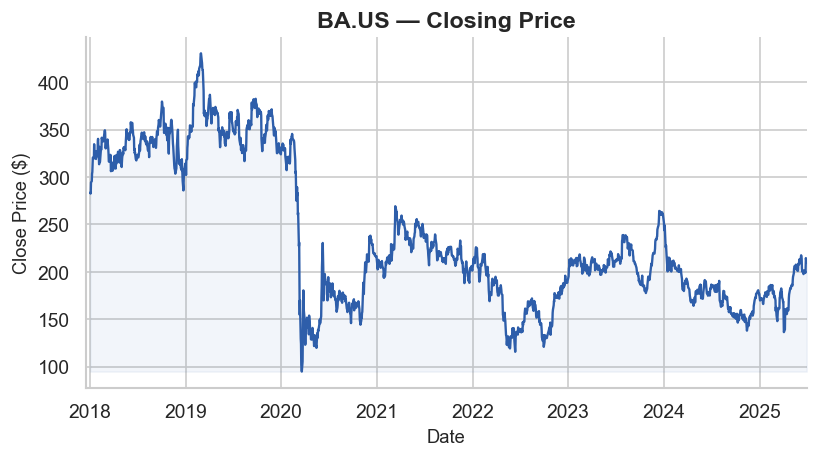

BA.US: interactive view shown above; static PNG saved for GitHub display


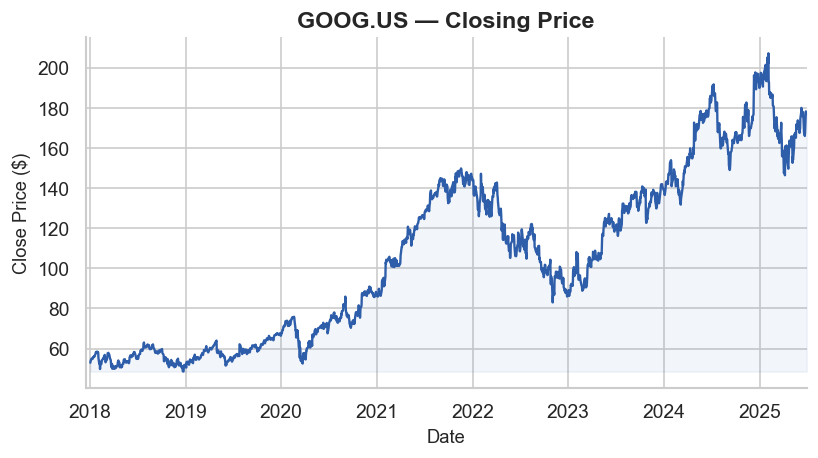

GOOG.US: interactive view shown above; static PNG saved for GitHub display


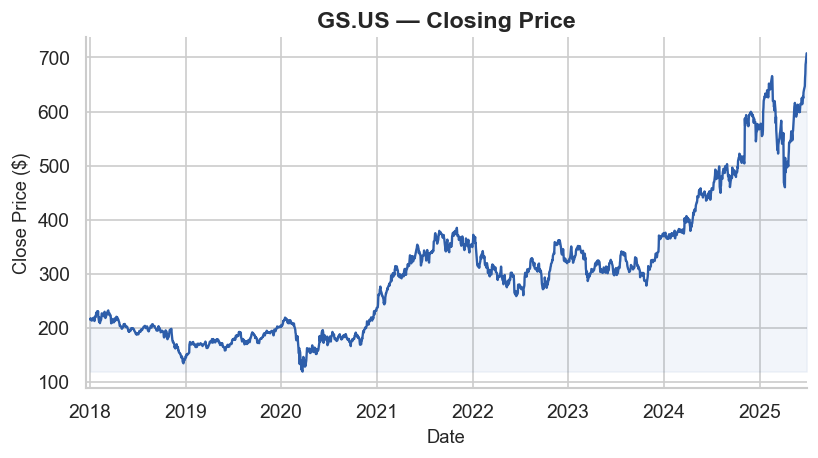

GS.US: interactive view shown above; static PNG saved for GitHub display


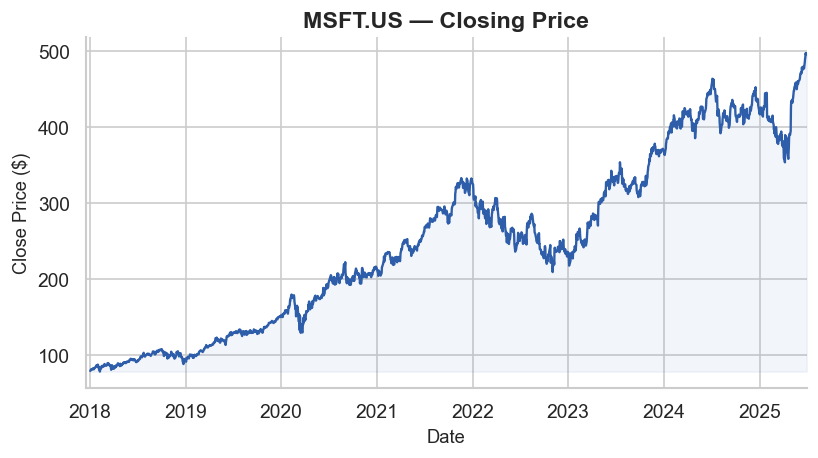

MSFT.US: interactive view shown above; static PNG saved for GitHub display


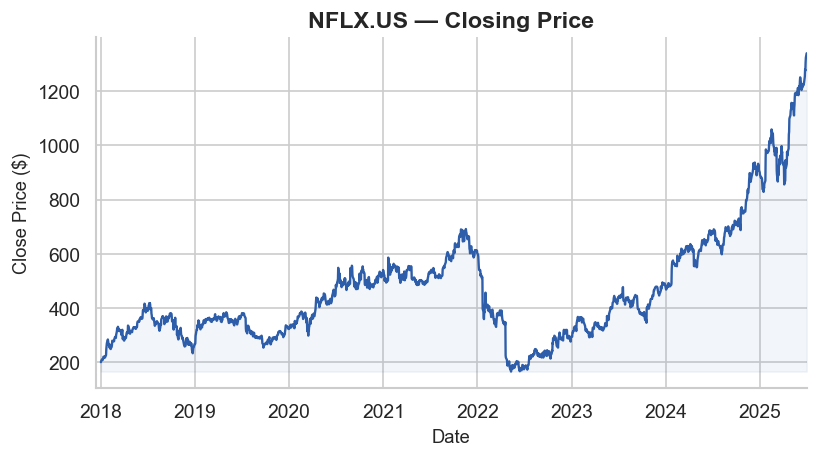

NFLX.US: interactive view shown above; static PNG saved for GitHub display


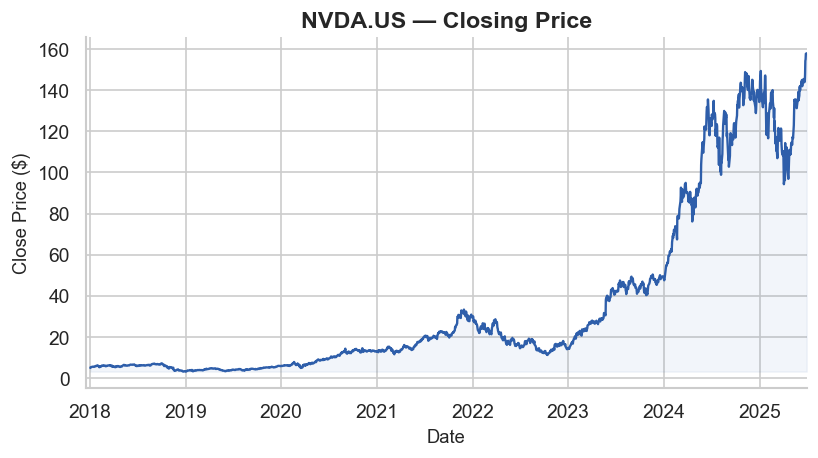

NVDA.US: interactive view shown above; static PNG saved for GitHub display


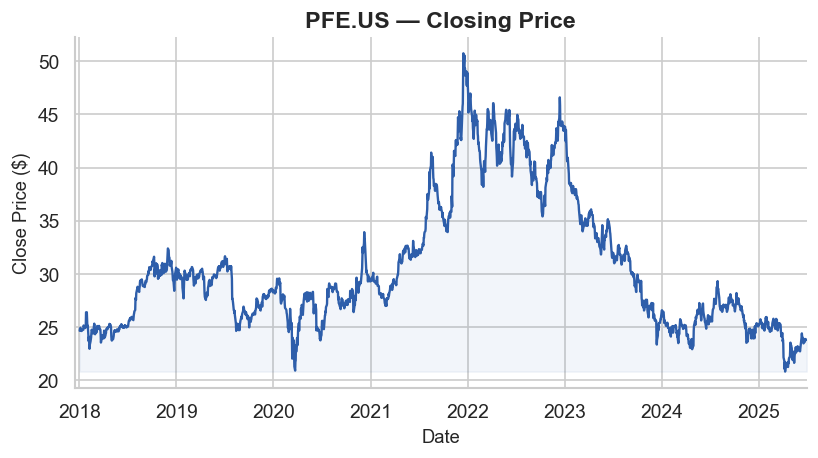

PFE.US: interactive view shown above; static PNG saved for GitHub display


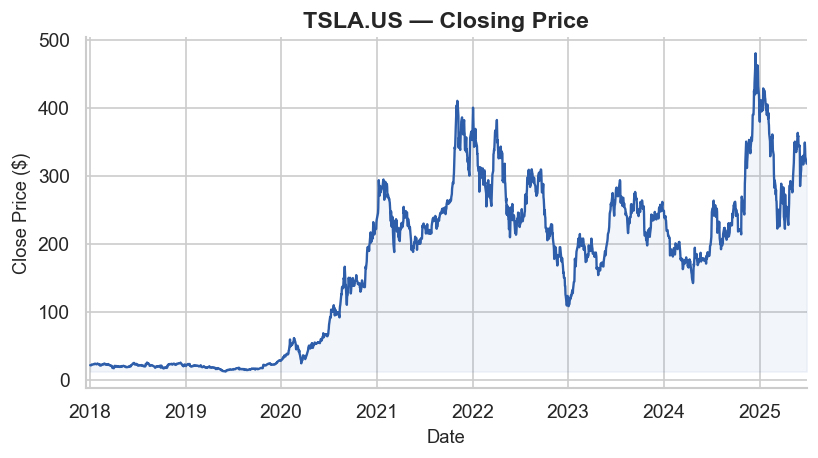

TSLA.US: interactive view shown above; static PNG saved for GitHub display

All closing price plots generated.


In [2]:
import datetime

for filename in os.listdir(DATA_DIR):
    if not filename.endswith(".csv"):
        continue

    filepath = os.path.join(DATA_DIR, filename)
    df = pd.read_csv(filepath)
    ticker = filename.split("_")[0]

    if 'date' not in df.columns or 'close' not in df.columns:
        print(f"Skipping {filename}: missing required columns")
        continue

    df['date'] = pd.to_datetime(df['date'], errors='coerce')
    df = df.dropna(subset=['date', 'close']).sort_values('date')
    end_date = df['date'].max()
    year_ticks = pd.date_range(start="2018-01-01", end=end_date, freq='YS')

    # Interactive version (for local exploration — hover tooltips, zoom/pan).
    # Note: this will not render in GitHub's static notebook preview.
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=df['date'], y=df['close'], mode='lines', name=ticker,
                              line=dict(color=PALETTE["primary"])))
    fig.update_layout(
        title=f"{ticker} Closing Prices", xaxis_title="Date", yaxis_title="Close Price",
        width=500, height=300, plot_bgcolor='white', paper_bgcolor='white', font=dict(color='black'),
        xaxis=dict(tickvals=year_ticks, tickformat="%Y", showgrid=True, gridcolor='lightgray',
                   range=[datetime.datetime(2017, 12, 15), end_date]),
        yaxis=dict(showgrid=True, gridcolor='lightgray')
    )
    fig.show()

    # Static version (this is the one that actually displays on GitHub / in the README)
    fig2, ax = plt.subplots(figsize=(7, 4))
    ax.plot(df['date'], df['close'], color=PALETTE["primary"], linewidth=1.4)
    ax.fill_between(df['date'], df['close'], df['close'].min(), color=PALETTE["primary"], alpha=0.06)
    ax.set_title(f"{ticker} — Closing Price")
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Price ($)")
    ax.set_xticks([pd.to_datetime(f"{y}-01-01") for y in range(2018, end_date.year + 1)])
    ax.set_xticklabels([str(y) for y in range(2018, end_date.year + 1)])
    ax.set_xlim(pd.to_datetime("2017-12-15"), end_date)
    plt.tight_layout()
    plt.savefig(os.path.join(PLOTS_DIR, f"{ticker}_closing_plot.png"))
    plt.show()
    plt.close()

    print(f"{ticker}: interactive view shown above; static PNG saved for GitHub display")

print("\nAll closing price plots generated.")


## 2. Feature Correlation Analysis

Correlation of each engineered feature with adjusted closing price — first per ticker, then combined across all tickers, then as detailed heatmaps for a single ticker (AAPL used as the example).

### 2.1 Per-ticker feature correlation (bar plots)

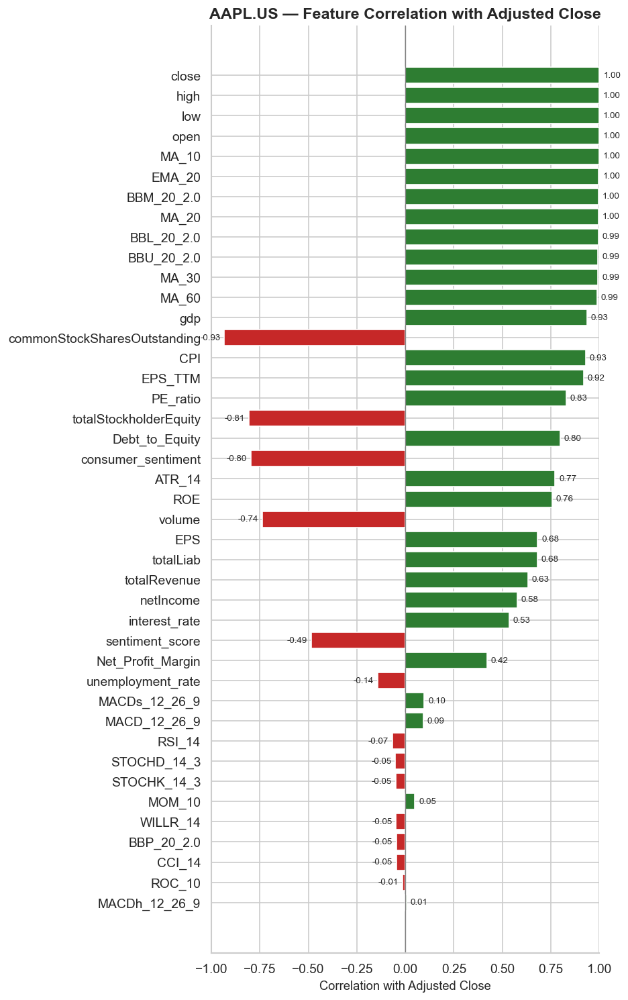

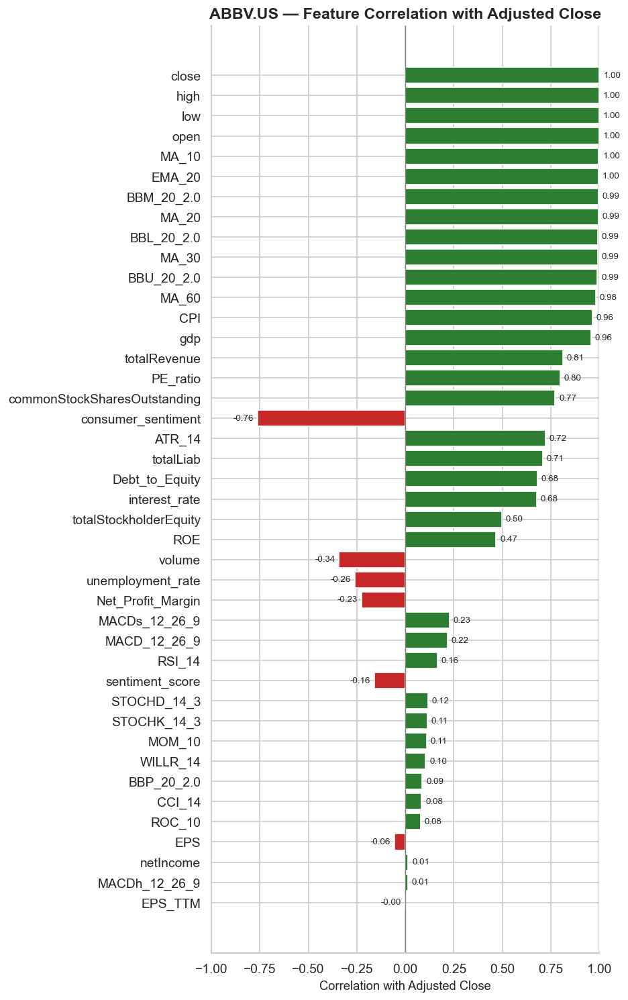

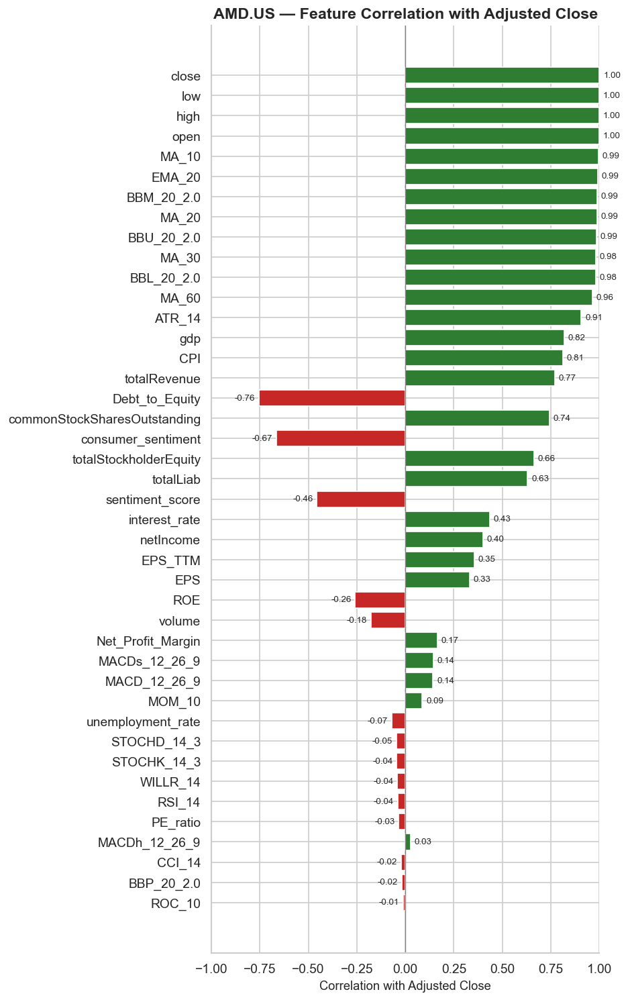

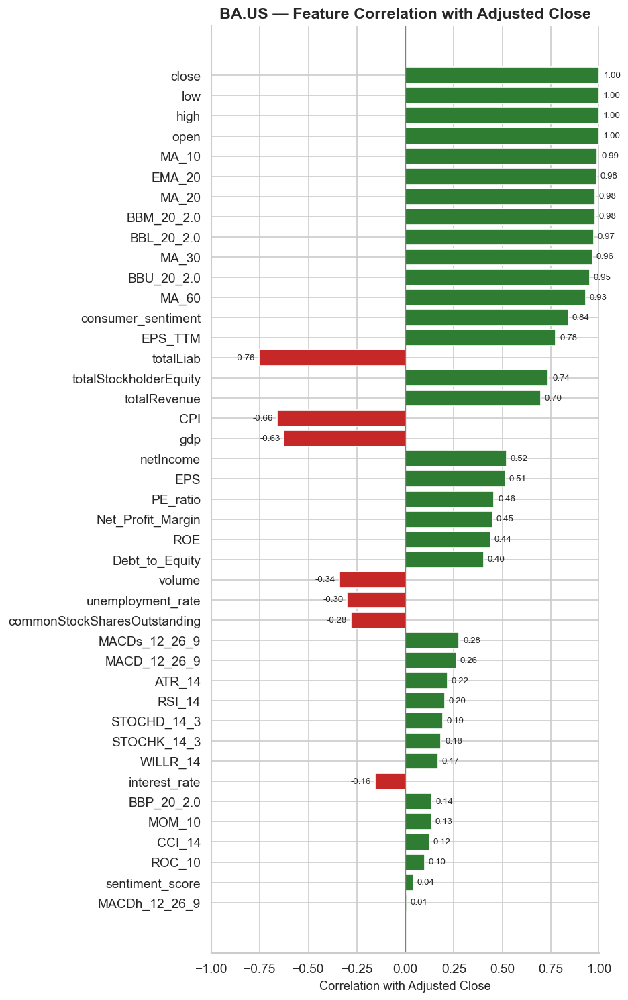

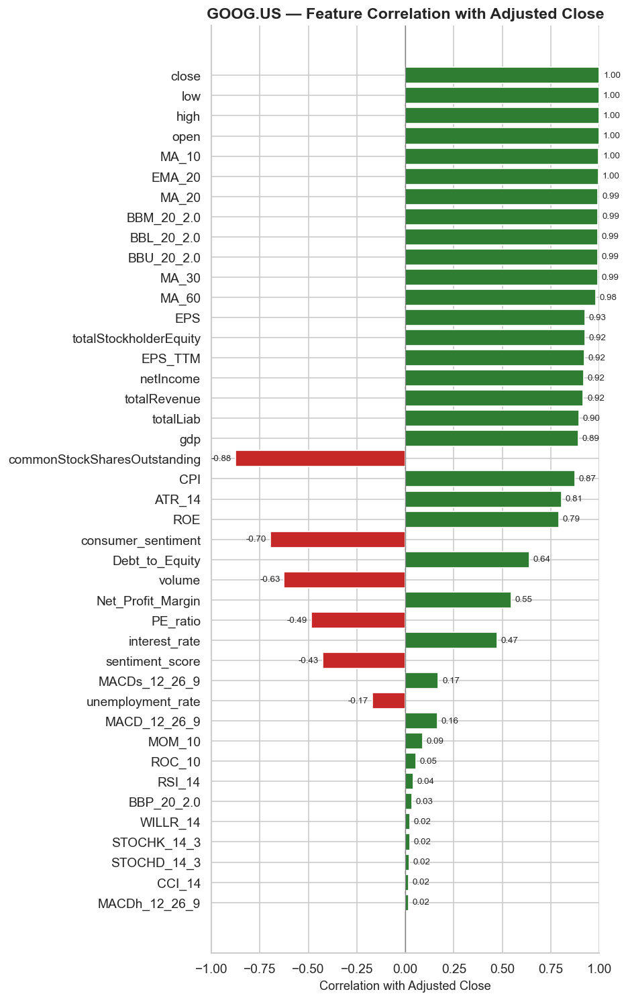

...

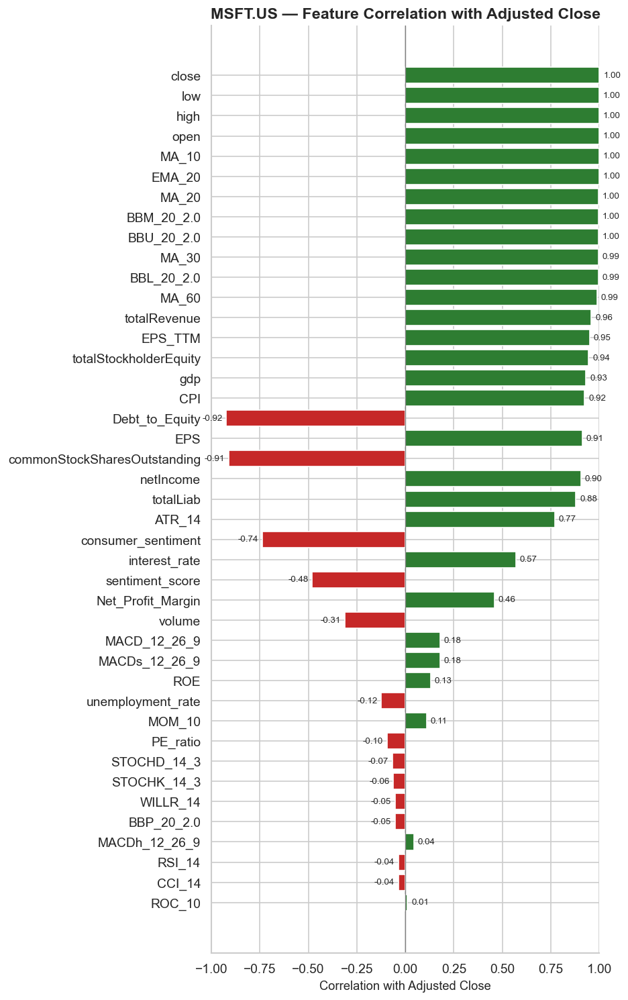

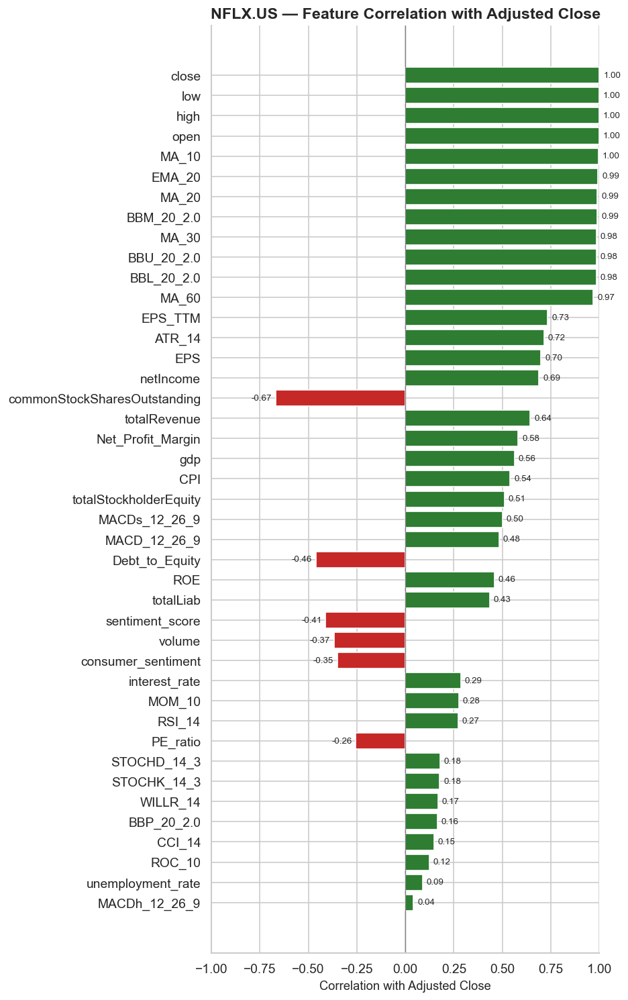

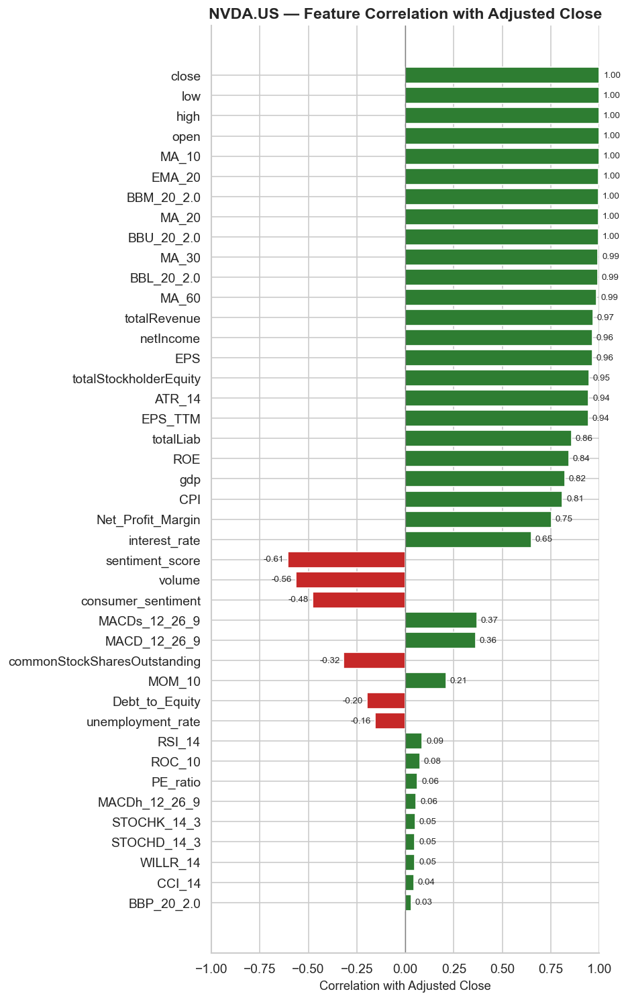

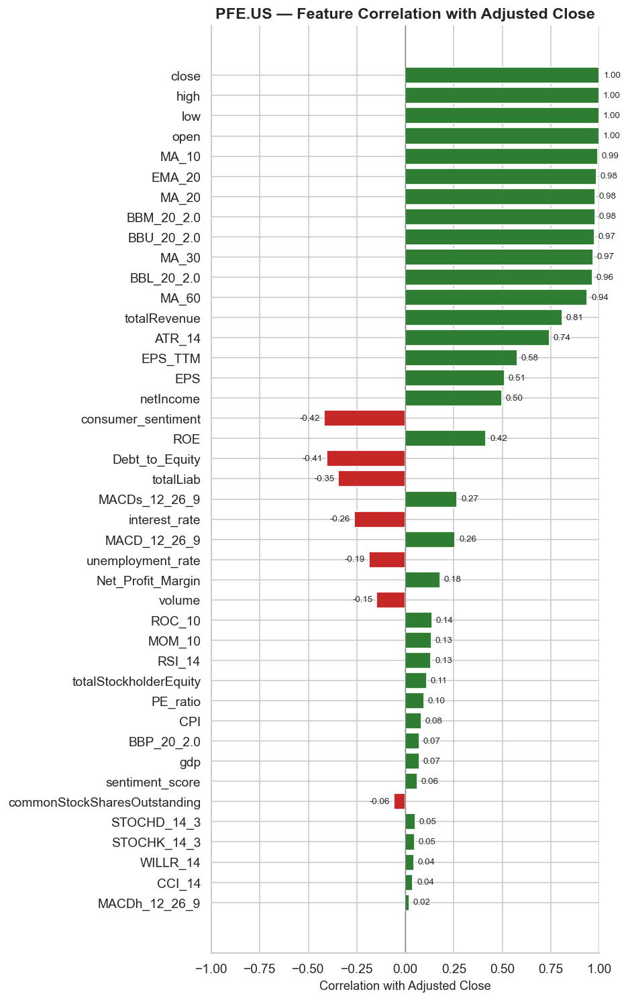

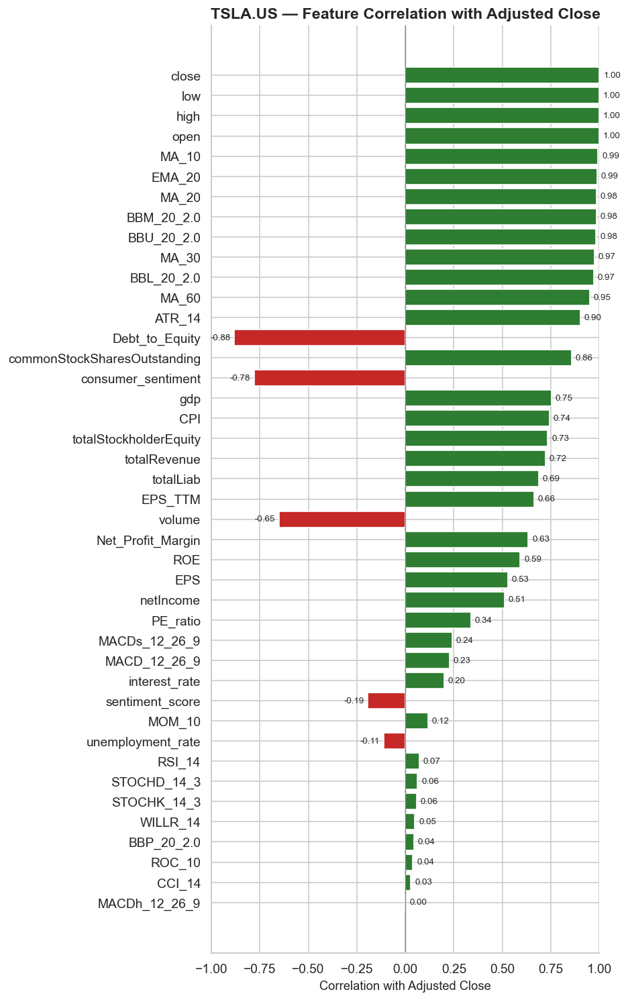

All per-ticker feature correlation plots generated.


In [3]:
output_folder = os.path.join(PLOTS_DIR, "feature_correlation_barplots")
os.makedirs(output_folder, exist_ok=True)

for filename in os.listdir(DATA_DIR):
    if not filename.endswith(".csv"):
        continue

    filepath = os.path.join(DATA_DIR, filename)
    df = pd.read_csv(filepath)
    ticker = filename.split("_")[0]
    df = fix_sentiment_score(df)

    numeric_df = df.select_dtypes(include='number').dropna()
    if 'adjusted_close' not in numeric_df.columns:
        print(f"Skipping {ticker}: 'adjusted_close' missing.")
        continue

    correlations = numeric_df.corr()['adjusted_close'].drop('adjusted_close')
    if correlations.empty:
        continue
    correlations = correlations.reindex(correlations.abs().sort_values(ascending=True).index)

    fig, ax = plt.subplots(figsize=(8, max(4, 0.3 * len(correlations))))
    colors = [PALETTE["positive"] if v > 0 else PALETTE["negative"] for v in correlations.values]
    bars = ax.barh(correlations.index, correlations.values, color=colors)
    ax.axvline(0, color='gray', linewidth=0.8)
    ax.set_xlabel("Correlation with Adjusted Close")
    ax.set_title(f"{ticker} — Feature Correlation with Adjusted Close")
    ax.set_xlim(-1, 1)

    for bar, value in zip(bars, correlations.values):
        ax.text(value + (0.02 if value > 0 else -0.02), bar.get_y() + bar.get_height() / 2,
                f"{value:.2f}", va='center', ha='left' if value > 0 else 'right', fontsize=8)

    plt.tight_layout()
    plt.savefig(os.path.join(output_folder, f"{ticker}_all_feature_correlations.png"))
    plt.show()
    plt.close()

print("All per-ticker feature correlation plots generated.")


### 2.2 Note on interactive exploration

An interactive Plotly version of the correlation chart above is useful for local exploration (hover tooltips, zoom) but is omitted here — Plotly's interactive output does not render in GitHub's static notebook preview, so it would show as blank to anyone browsing the repo. The static chart in 2.1 covers the same information and displays reliably everywhere.

### 2.3 Combined correlation across all tickers

Plot saved to: plots\combined_feature_correlation_bar_chart.png


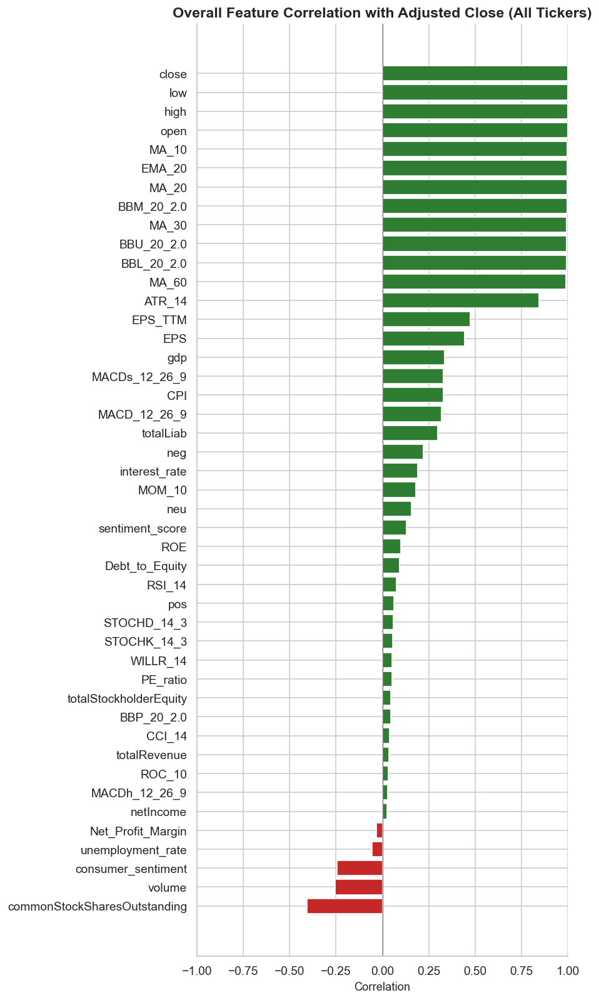

In [4]:
def create_combined_correlation_plot():
    all_dataframes = []
    for filename in os.listdir(DATA_DIR):
        if filename.endswith(".csv"):
            filepath = os.path.join(DATA_DIR, filename)
            try:
                all_dataframes.append(pd.read_csv(filepath))
            except Exception as e:
                print(f"Could not read {filename}: {e}")

    if not all_dataframes:
        print("No CSV files found.")
        return

    combined_df = pd.concat(all_dataframes, ignore_index=True)
    if 'adjusted_close' not in combined_df.columns:
        print("'adjusted_close' column not found in combined data.")
        return

    correlations = combined_df.corr(numeric_only=True)[['adjusted_close']] \
        .sort_values(by='adjusted_close', ascending=True).drop('adjusted_close')

    fig, ax = plt.subplots(figsize=(8, max(4, 0.3 * len(correlations))))
    colors = [PALETTE["positive"] if c > 0 else PALETTE["negative"] for c in correlations['adjusted_close']]
    ax.barh(correlations.index, correlations['adjusted_close'], color=colors)
    ax.axvline(0, color='gray', linewidth=0.8)
    ax.set_title('Overall Feature Correlation with Adjusted Close (All Tickers)')
    ax.set_xlabel('Correlation')
    ax.set_xlim(-1, 1)
    plt.tight_layout()

    output_path = os.path.join(PLOTS_DIR, "combined_feature_correlation_bar_chart.png")
    plt.savefig(output_path)
    print(f"Plot saved to: {output_path}")
    plt.show()


create_combined_correlation_plot()


### 2.4 Detailed correlation heatmaps (example: AAPL)

Plot saved to: plots\AAPL.US_correlation_heatmap.png


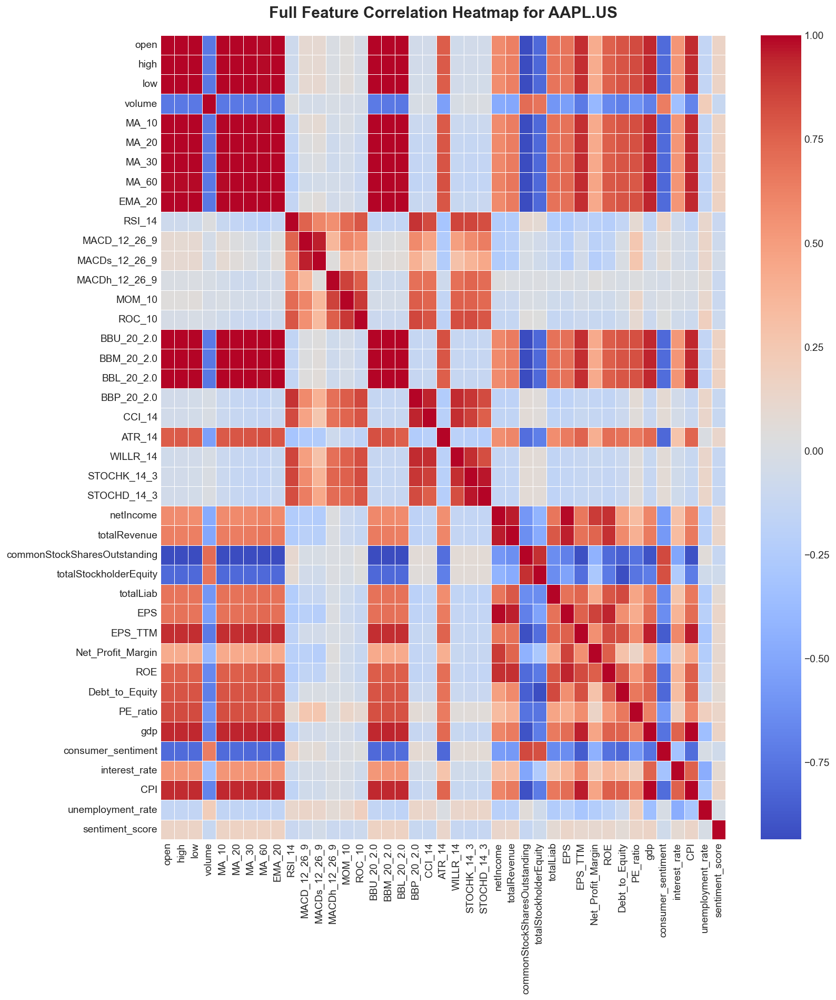

In [5]:
def create_single_stock_heatmap(ticker_symbol, input_folder=DATA_DIR, output_folder=PLOTS_DIR):
    """Full feature correlation heatmap for a single ticker."""
    os.makedirs(output_folder, exist_ok=True)
    filepath = os.path.join(input_folder, f"{ticker_symbol}_data.csv")
    if not os.path.exists(filepath):
        print(f"File not found at '{filepath}'")
        return

    df = pd.read_csv(filepath)
    df_filtered = df.drop(columns=['neu', 'neg', 'pos', 'close', 'adjusted_close'], errors='ignore')
    numeric_df = df_filtered.select_dtypes(include='number')
    correlation_matrix = numeric_df.corr()

    plt.style.use('seaborn-v0_8-whitegrid')
    fig, ax = plt.subplots(figsize=(14, 16))
    sns.heatmap(correlation_matrix, annot=False, cmap="coolwarm", linewidths=.5, ax=ax)
    ax.set_title(f'Full Feature Correlation Heatmap for {ticker_symbol}', fontsize=18, pad=20)
    plt.xticks(rotation=90); plt.yticks(rotation=0)
    plt.tight_layout()

    output_path = os.path.join(output_folder, f"{ticker_symbol}_correlation_heatmap.png")
    plt.savefig(output_path)
    print(f"Plot saved to: {output_path}")
    plt.show()


create_single_stock_heatmap(ticker_symbol='AAPL.US')


Plot saved to: plots\AAPL.US_filtered_correlation_heatmap.png


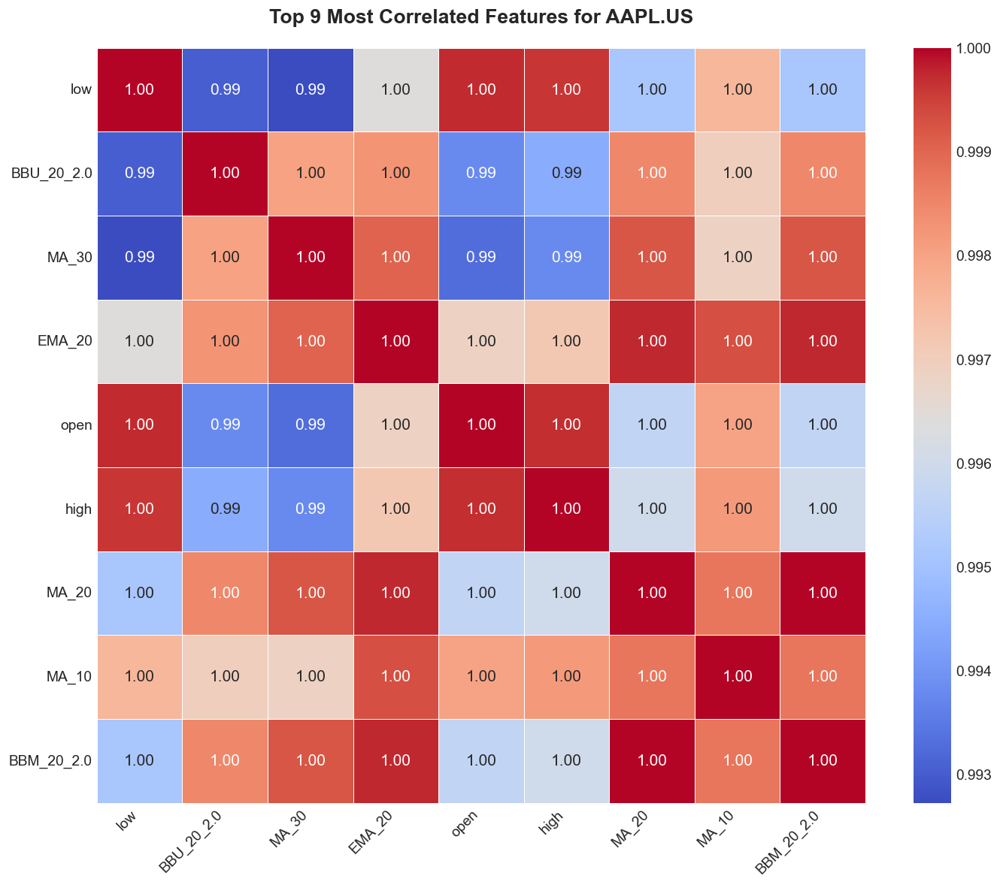

In [6]:
def create_top_n_correlation_heatmap(ticker_symbol, top_n_features=15, input_folder=DATA_DIR, output_folder=PLOTS_DIR):
    """Heatmap restricted to the top-N most strongly correlated feature pairs."""
    os.makedirs(output_folder, exist_ok=True)
    filepath = os.path.join(input_folder, f"{ticker_symbol}_data.csv")
    if not os.path.exists(filepath):
        print(f"File not found at '{filepath}'")
        return

    df = pd.read_csv(filepath)
    df_filtered = df.drop(columns=['neu', 'neg', 'pos', 'close', 'adjusted_close'], errors='ignore')
    numeric_df = df_filtered.select_dtypes(include='number')
    correlation_matrix = numeric_df.corr()

    corr_pairs = correlation_matrix.unstack()
    sorted_pairs = corr_pairs.abs().sort_values(ascending=False)
    sorted_pairs = sorted_pairs[sorted_pairs < 1.0]

    top_pairs = sorted_pairs.head(top_n_features * 2)
    top_features = list(set([idx[0] for idx in top_pairs.index] + [idx[1] for idx in top_pairs.index]))[:top_n_features]

    filtered_corr_matrix = correlation_matrix.loc[top_features, top_features]

    plt.style.use('seaborn-v0_8-whitegrid')
    fig, ax = plt.subplots(figsize=(12, 10))
    sns.heatmap(filtered_corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=.5, ax=ax)
    ax.set_title(f'Top {len(top_features)} Most Correlated Features for {ticker_symbol}', fontsize=16, pad=20)
    plt.xticks(rotation=45, ha='right'); plt.yticks(rotation=0)
    plt.tight_layout()

    output_path = os.path.join(output_folder, f"{ticker_symbol}_filtered_correlation_heatmap.png")
    plt.savefig(output_path)
    print(f"Plot saved to: {output_path}")
    plt.show()


create_top_n_correlation_heatmap(ticker_symbol='AAPL.US', top_n_features=15)


Plot saved to: plots\AAPL.US_threshold_correlation_heatmap.png


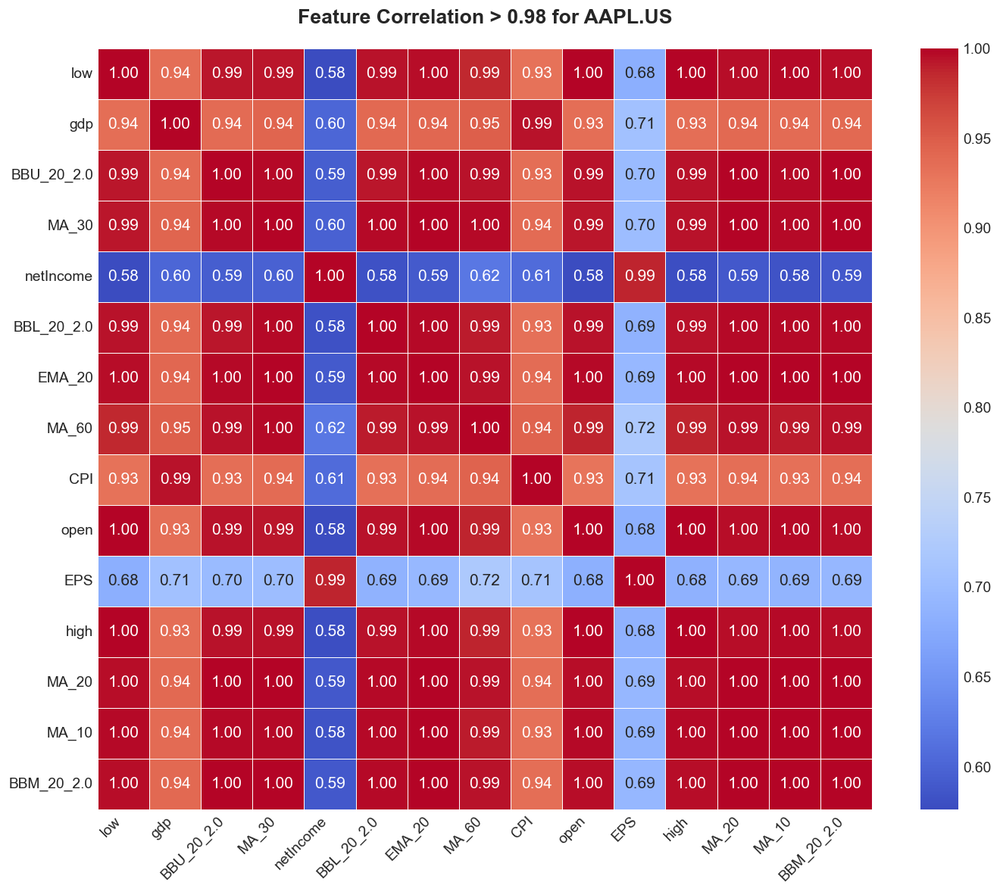

In [7]:
def create_threshold_correlation_heatmap(ticker_symbol, corr_threshold=0.75, input_folder=DATA_DIR, output_folder=PLOTS_DIR):
    """Heatmap restricted to feature pairs above a given absolute correlation threshold."""
    os.makedirs(output_folder, exist_ok=True)
    filepath = os.path.join(input_folder, f"{ticker_symbol}_data.csv")
    if not os.path.exists(filepath):
        print(f"File not found at '{filepath}'")
        return

    df = pd.read_csv(filepath)
    df_filtered = df.drop(columns=['neu', 'neg', 'pos', 'close', 'adjusted_close'], errors='ignore')
    numeric_df = df_filtered.select_dtypes(include='number')
    correlation_matrix = numeric_df.corr()

    corr_pairs = correlation_matrix.unstack()
    sorted_pairs = corr_pairs.abs().sort_values(ascending=False)
    sorted_pairs = sorted_pairs[sorted_pairs < 1.0]
    high_corr_pairs = sorted_pairs[sorted_pairs > corr_threshold]

    top_features = list(set([idx[0] for idx in high_corr_pairs.index] + [idx[1] for idx in high_corr_pairs.index]))
    if not top_features:
        print(f"No features found with correlation above {corr_threshold}.")
        return

    filtered_corr_matrix = correlation_matrix.loc[top_features, top_features]

    plt.style.use('seaborn-v0_8-whitegrid')
    fig, ax = plt.subplots(figsize=(12, 10))
    sns.heatmap(filtered_corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=.5, ax=ax)
    ax.set_title(f'Feature Correlation > {corr_threshold} for {ticker_symbol}', fontsize=16, pad=20)
    plt.xticks(rotation=45, ha='right'); plt.yticks(rotation=0)
    plt.tight_layout()

    output_path = os.path.join(output_folder, f"{ticker_symbol}_threshold_correlation_heatmap.png")
    plt.savefig(output_path)
    print(f"Plot saved to: {output_path}")
    plt.show()


create_threshold_correlation_heatmap(ticker_symbol='AAPL.US', corr_threshold=0.98)


**Section 2 takeaway:** Feature correlation with adjusted close is dominated by co-moving price fields (open/high/low) and short-window moving averages, as expected — these are near-collinear with the target by construction. The more informative signal for modeling is *not* raw correlation strength but which of these highly-correlated features survive feature selection (see Section 3.5) without introducing redundancy.

## 3. SHAP Feature Importance

Analyzes which engineered features the proposed CNN–LSTM model relied on most, using pre-computed SHAP values (`results/shap_summary_all.csv`, `results/shap_summary_model_LSTM_CNN.csv`).

### 3.1 Feature importance by temporal window

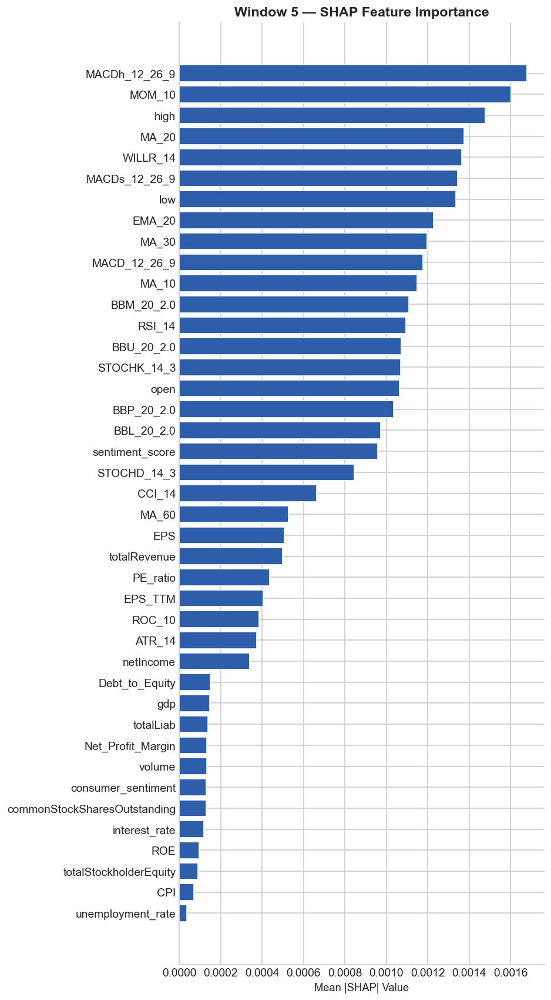

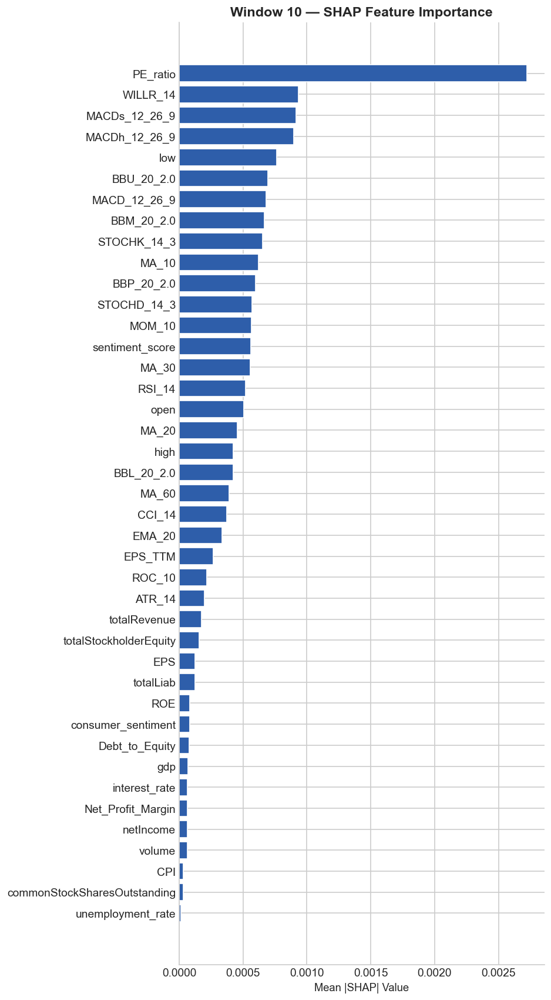

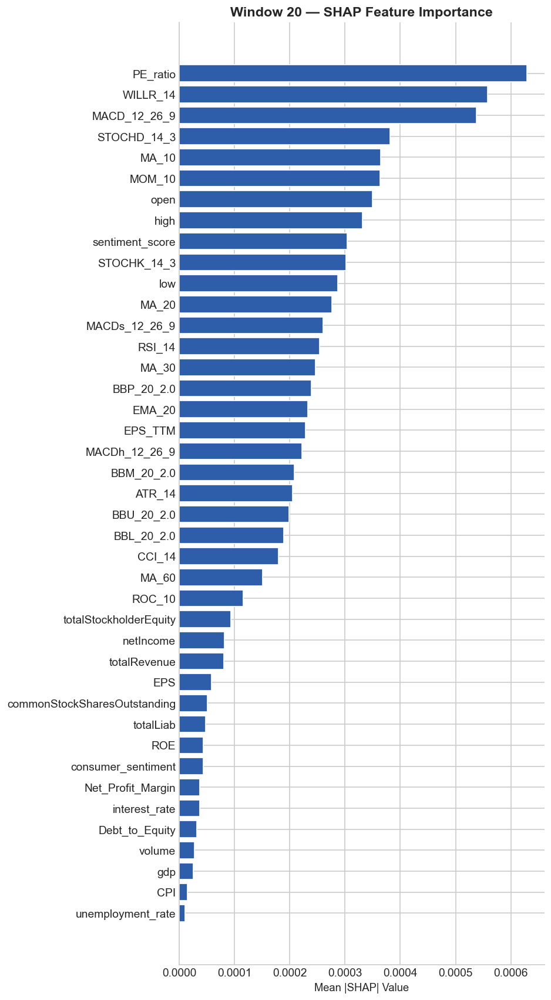

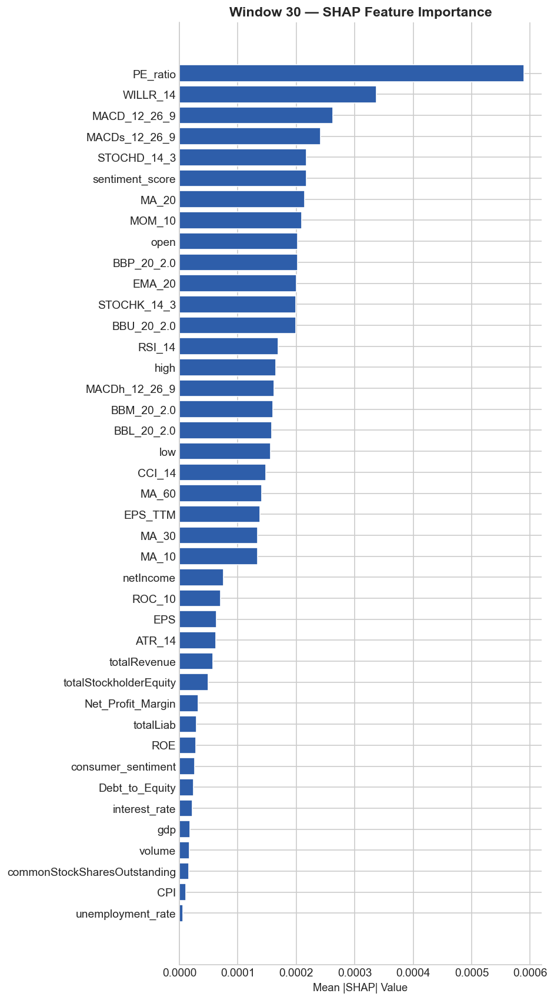

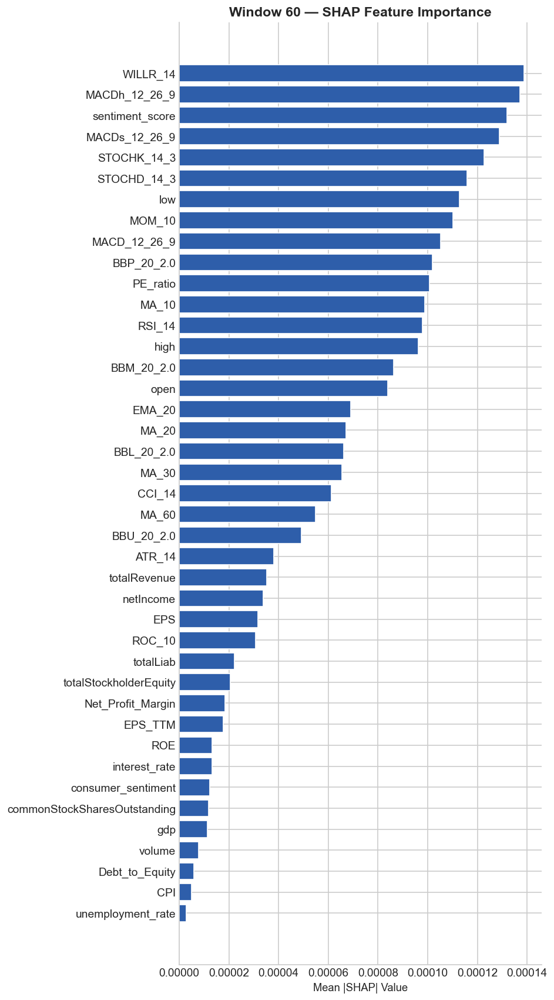

In [8]:
shap_df = pd.read_csv(os.path.join(RESULTS_DIR, "shap_summary_all.csv"))
avg_shap = shap_df.groupby(['window', 'feature'])['mean_abs_shap'].mean().reset_index()

output_dir = os.path.join(PLOTS_DIR, "shap_feature_plots")
os.makedirs(output_dir, exist_ok=True)

for window in sorted(avg_shap['window'].unique()):
    subset = avg_shap[avg_shap['window'] == window].sort_values(by='mean_abs_shap', ascending=True)

    fig, ax = plt.subplots(figsize=(8, max(4, 0.35 * len(subset))))
    ax.barh(subset['feature'], subset['mean_abs_shap'], color=PALETTE["primary"])
    ax.set_xlabel("Mean |SHAP| Value")
    ax.set_title(f"Window {window} — SHAP Feature Importance")
    plt.tight_layout()

    png_path = os.path.join(output_dir, f"window_{window}_shap_plot.png")
    plt.savefig(png_path)
    plt.show()
    plt.close()


### 3.2 Feature importance by ticker (all windows combined)

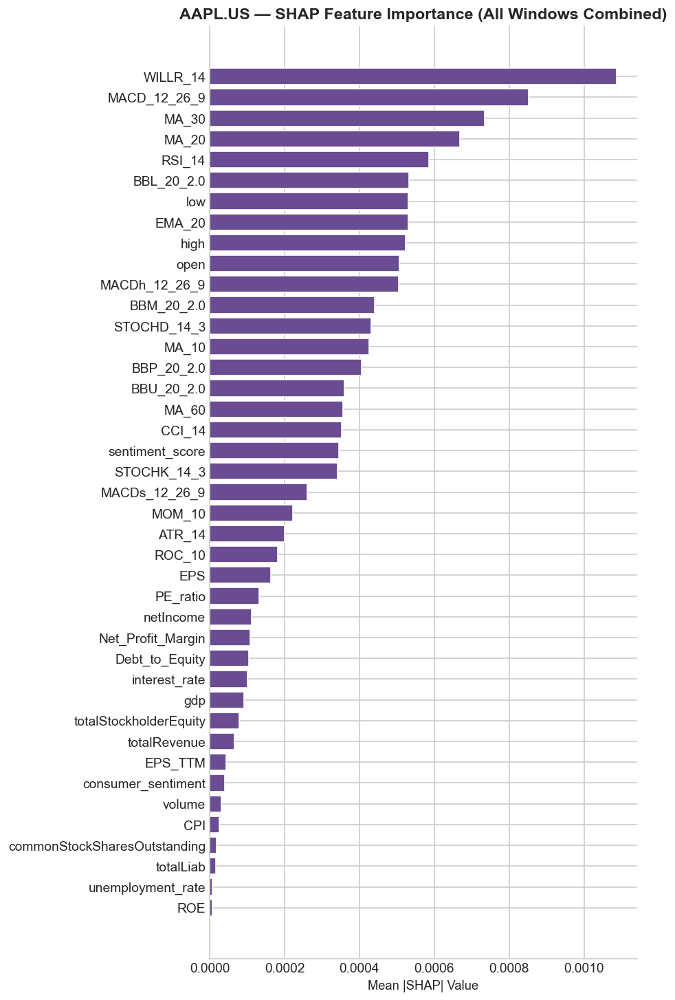

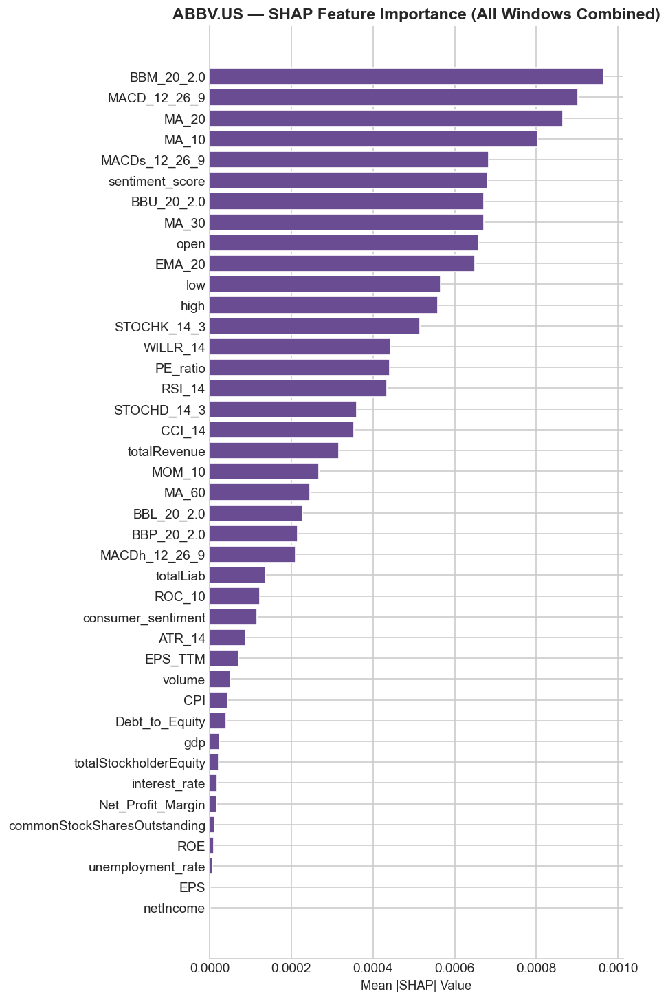

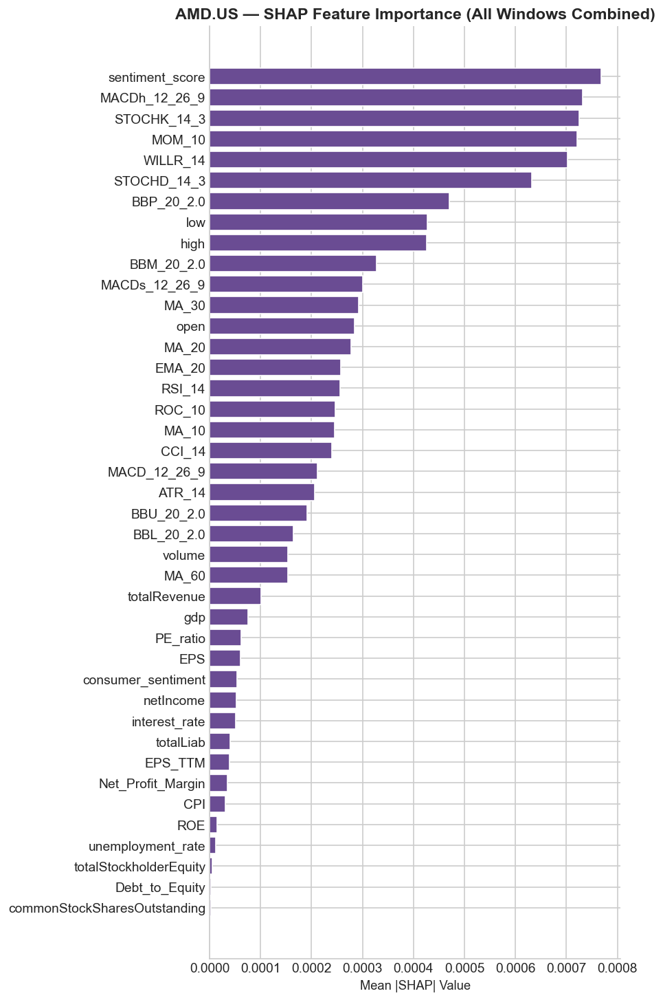

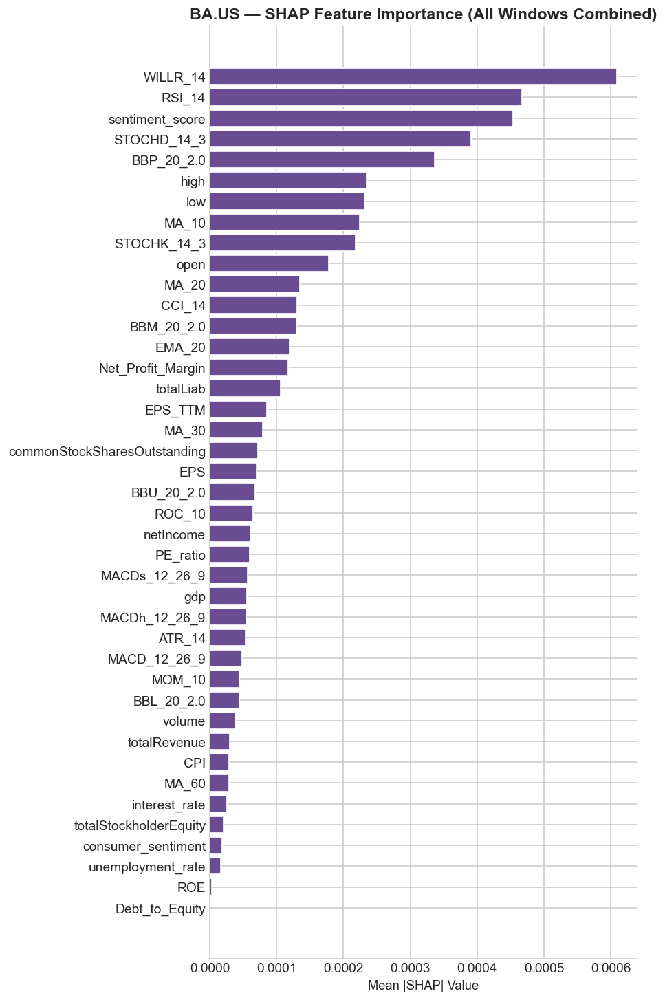

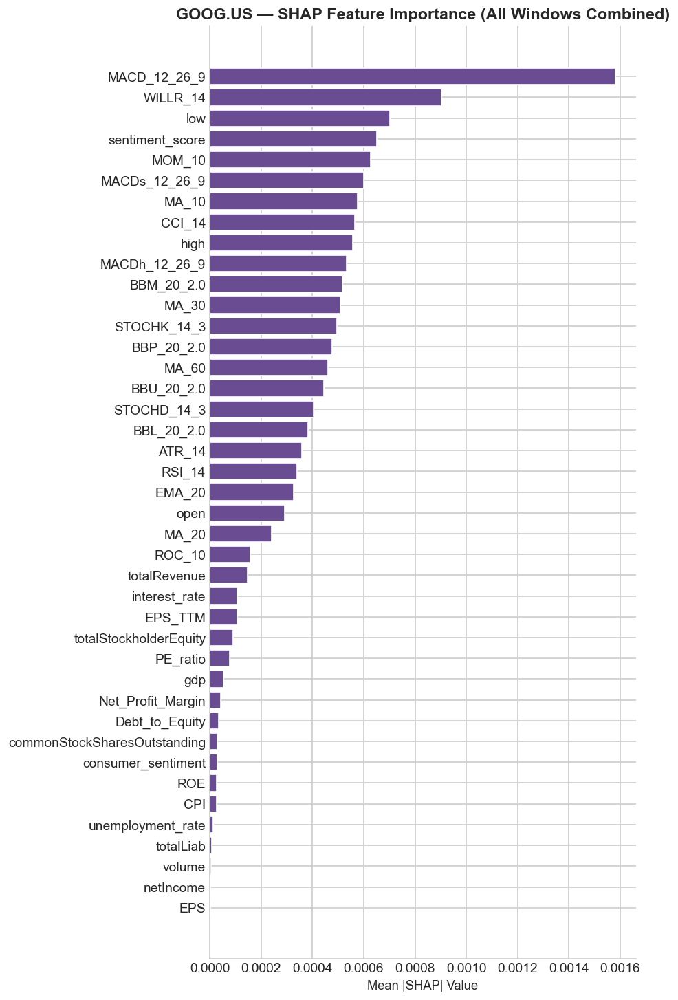

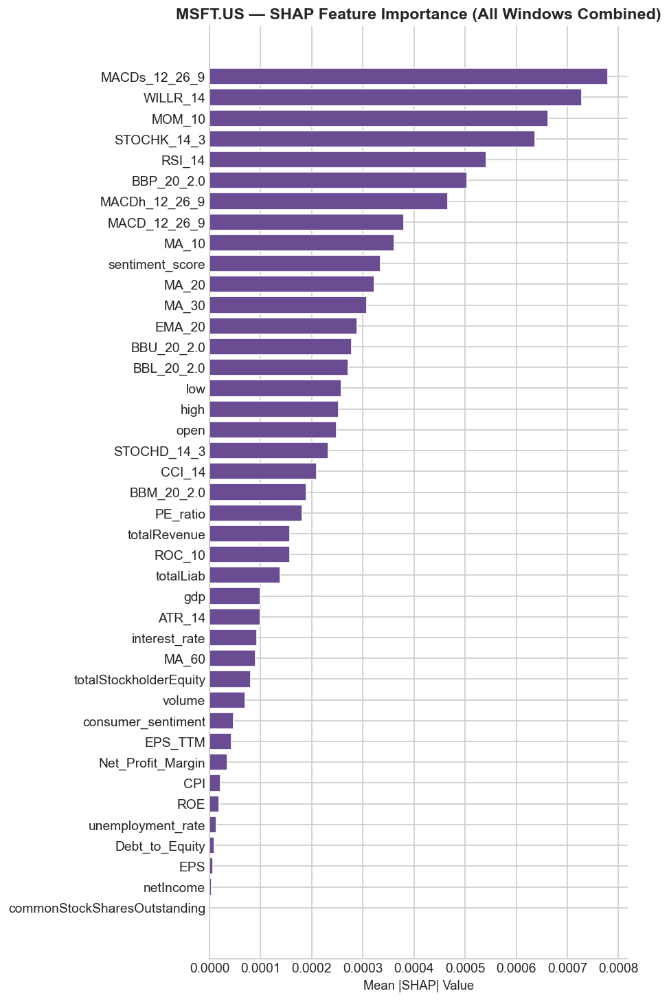

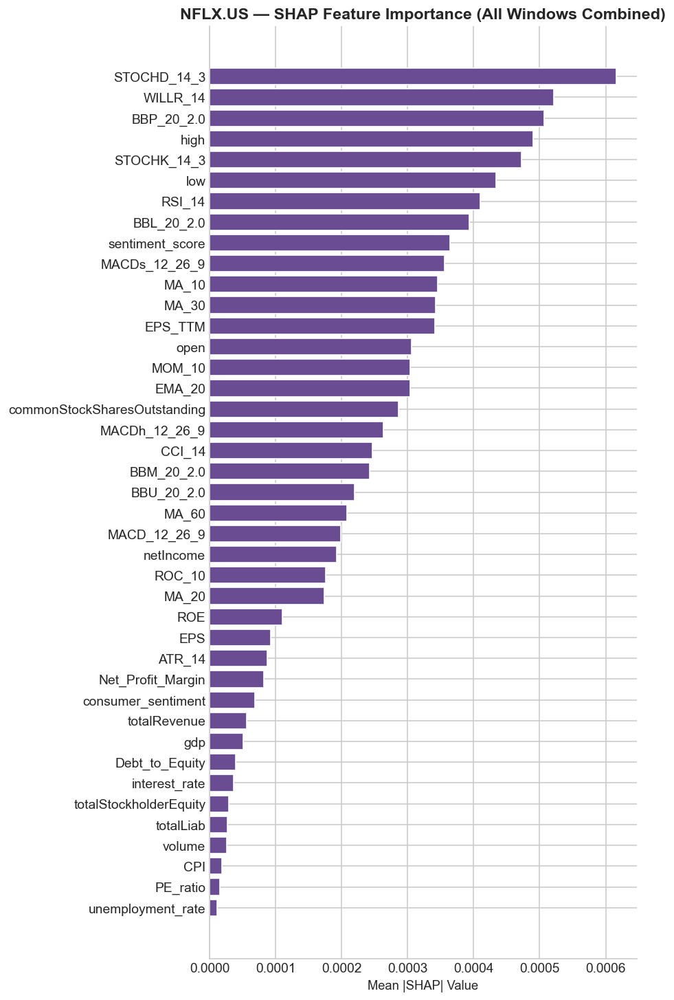

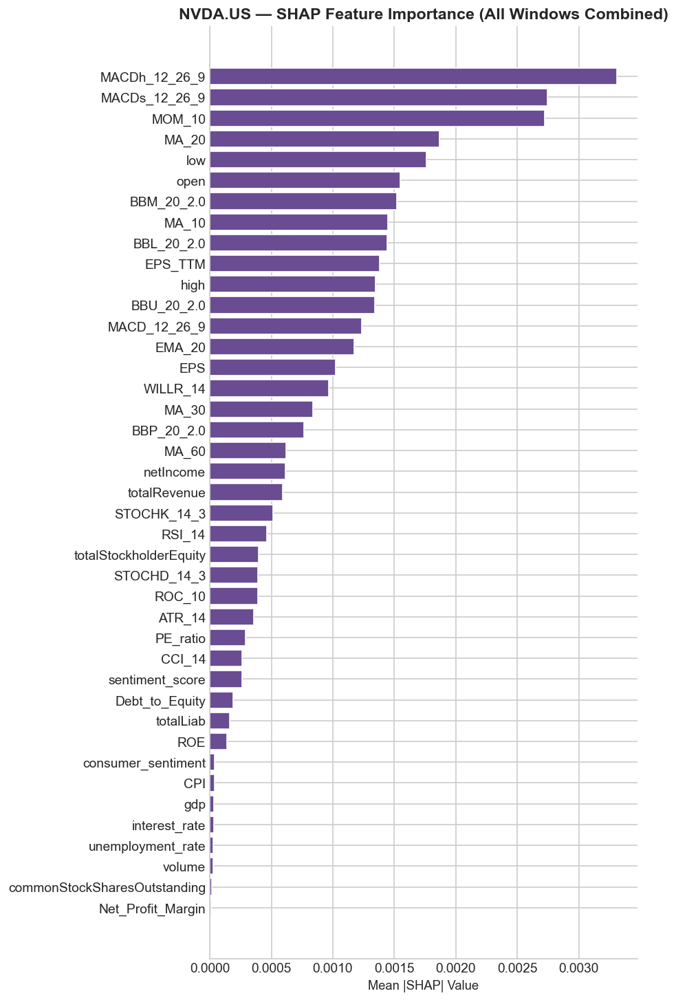

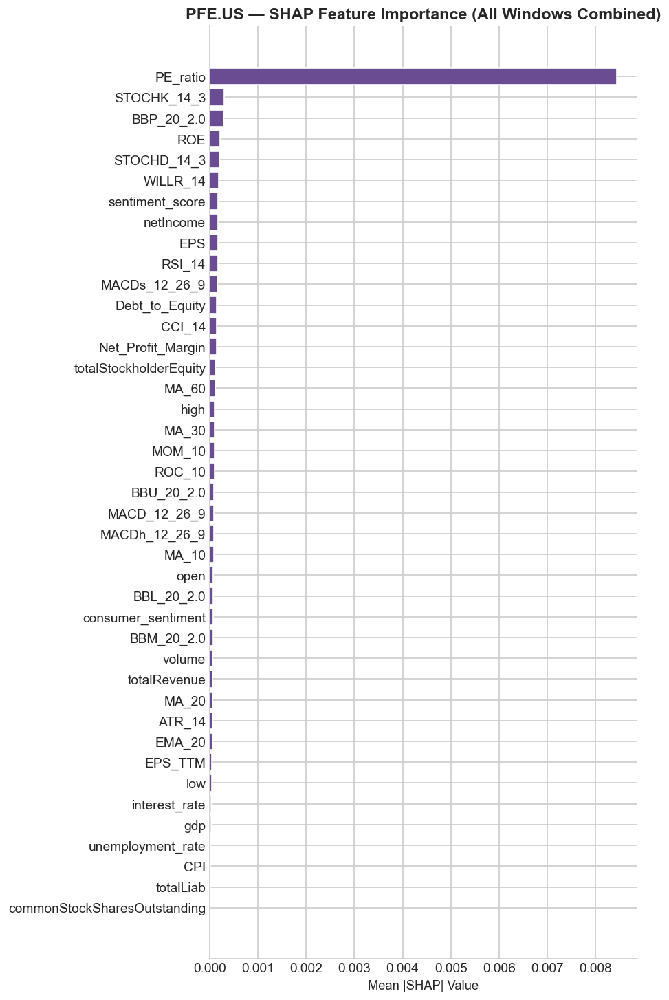

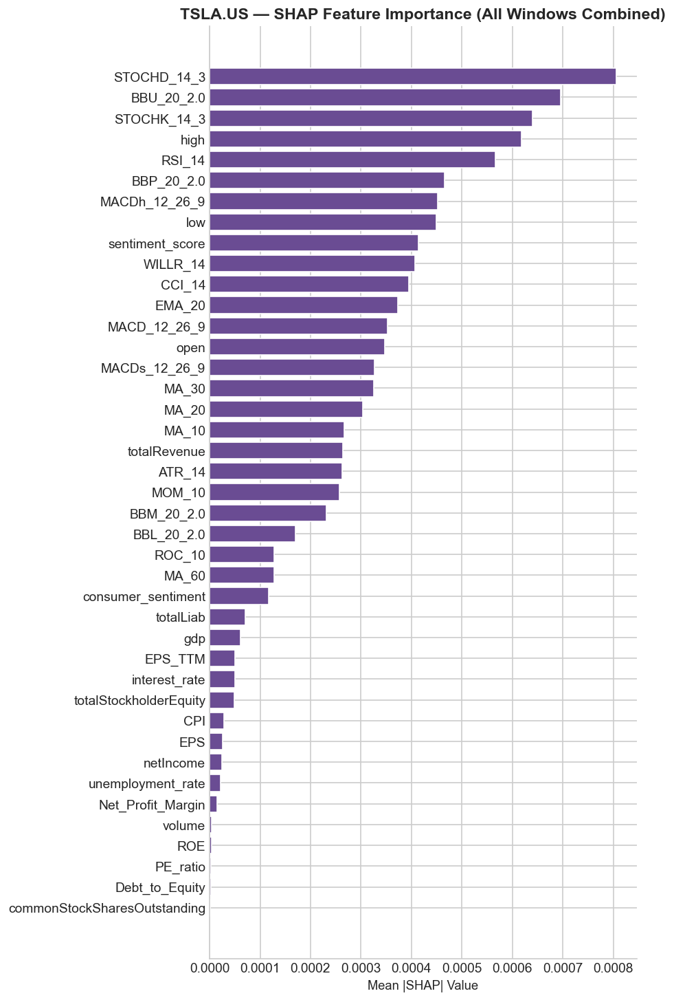

In [9]:
ticker_output_dir = os.path.join(PLOTS_DIR, "shap_feature_plots_by_ticker")
os.makedirs(ticker_output_dir, exist_ok=True)

for ticker in sorted(shap_df['ticker'].unique()):
    df_ticker = shap_df[shap_df['ticker'] == ticker]
    shap_summary = df_ticker.groupby('feature')['mean_abs_shap'].mean().reset_index() \
        .sort_values(by='mean_abs_shap', ascending=True)

    fig, ax = plt.subplots(figsize=(8, max(4, 0.3 * len(shap_summary))))
    ax.barh(shap_summary['feature'], shap_summary['mean_abs_shap'], color=PALETTE["accent"])
    ax.set_xlabel("Mean |SHAP| Value")
    ax.set_title(f"{ticker} — SHAP Feature Importance (All Windows Combined)")
    plt.tight_layout()

    png_path = os.path.join(ticker_output_dir, f"{ticker}_shap_combined_windows.png")
    plt.savefig(png_path)
    plt.show()
    plt.close()


### 3.3 Overall top features (across all tickers and windows)

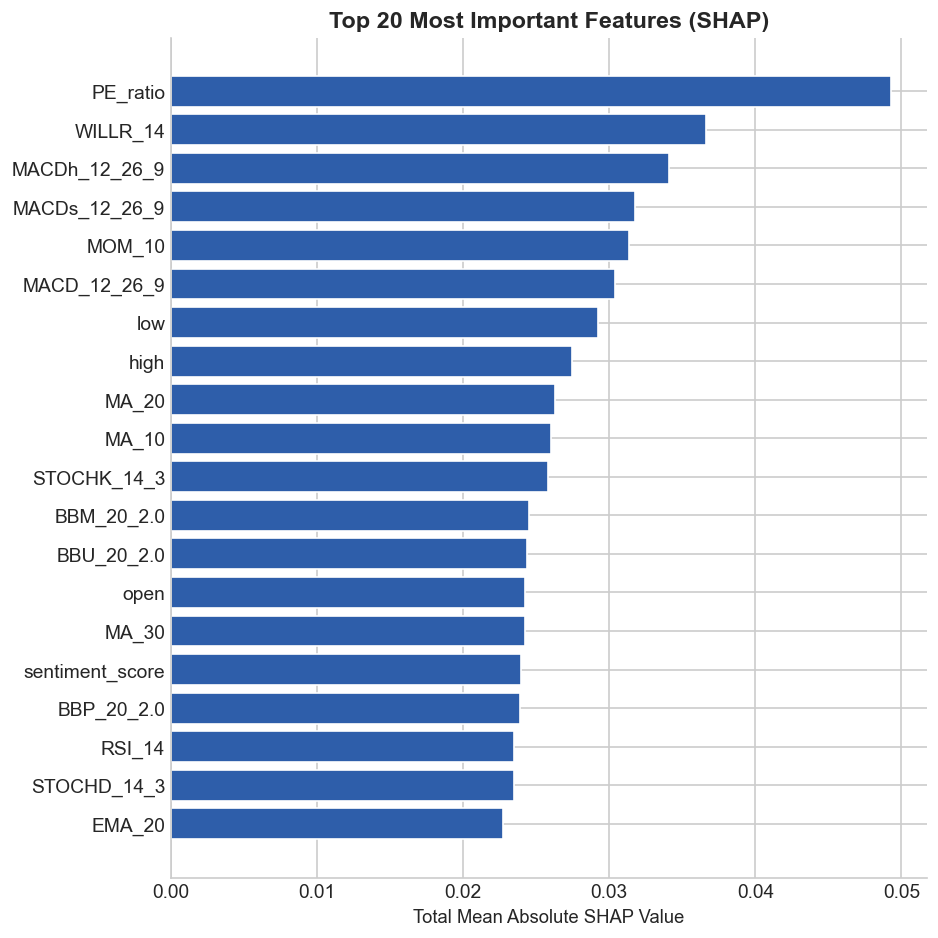

In [10]:
overall_ranking = shap_df.groupby('feature')['mean_abs_shap'].sum().nlargest(20).sort_values(ascending=True)

fig, ax = plt.subplots(figsize=(8, 8))
ax.barh(overall_ranking.index, overall_ranking.values, color=PALETTE["primary"])
ax.set_title('Top 20 Most Important Features (SHAP)')
ax.set_xlabel('Total Mean Absolute SHAP Value')
plt.tight_layout()
plt.savefig(os.path.join(PLOTS_DIR, 'top_20_features_overall.png'))
plt.show()


### 3.4 Top features per window (faceted view)

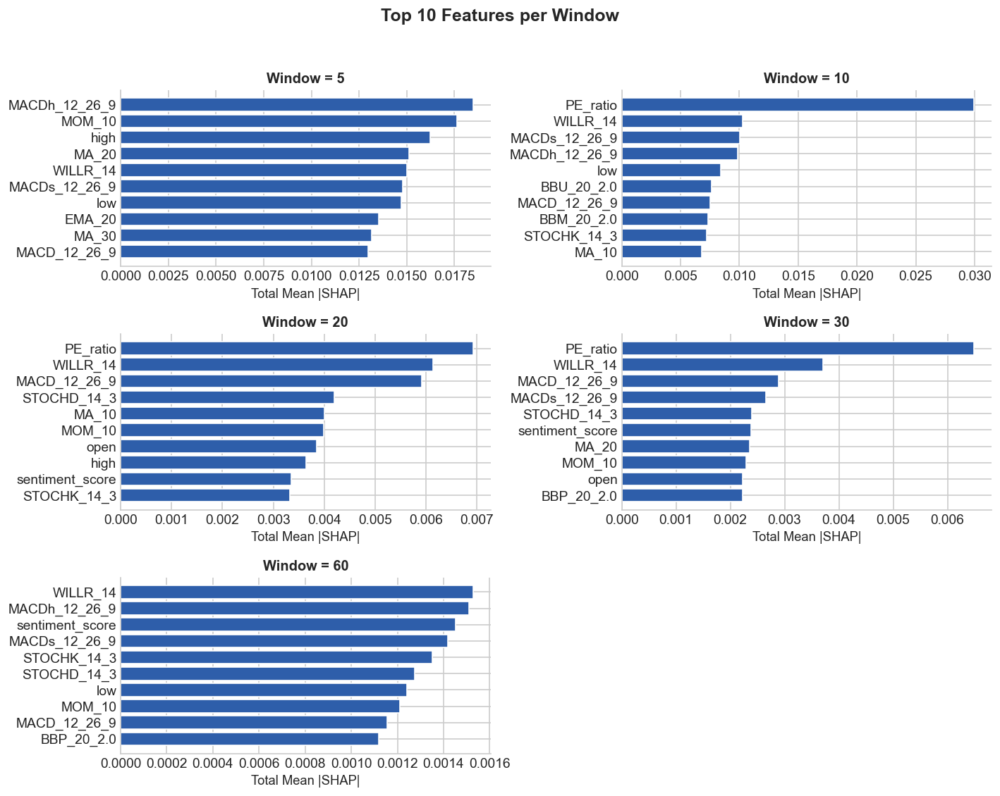

In [11]:
window_level_ranking = shap_df.groupby(['window', 'feature'])['mean_abs_shap'].sum()
windows = sorted(shap_df['window'].unique())

n_cols = 2
n_rows = -(-len(windows) // n_cols)  # ceil division
fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 3.2 * n_rows))
axes = axes.flatten()
fig.suptitle('Top 10 Features per Window', fontsize=15, fontweight='bold')

for i, window in enumerate(windows):
    top_features = window_level_ranking.loc[window].nlargest(10).sort_values()
    axes[i].barh(top_features.index, top_features.values, color=PALETTE["primary"])
    axes[i].set_title(f'Window = {window}', fontsize=12)
    axes[i].set_xlabel('Total Mean |SHAP|')

# hide any unused subplot slots
for j in range(len(windows), len(axes)):
    axes[j].axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig(os.path.join(PLOTS_DIR, 'top_10_features_per_window.png'))
plt.show()


### 3.5 Ridge RFE feature selection frequency

In [12]:
def plot_feature_frequency(json_file_path):
    """How often each feature was selected by Ridge RFE across all tickers/windows."""
    try:
        with open(json_file_path, 'r') as f:
            data = json.load(f)

        all_features = []
        for ticker, windows in data.items():
            for window, features in windows.items():
                all_features.extend(features)

        feature_counts = Counter(all_features)
        sorted_features = feature_counts.most_common()
        features, counts = zip(*sorted_features)

        sns.set(style="whitegrid")
        plt.figure(figsize=(10, 12))
        ax = sns.barplot(x=counts, y=list(features), orient='h', color=PALETTE["primary"])
        ax.set_title('Ridge Feature Frequency Across All Companies and Windows', fontsize=18, pad=20)
        ax.set_xlabel('Frequency (Count)', fontsize=14)
        ax.set_ylabel('Features', fontsize=14)
        plt.tight_layout()
        plt.show()

    except FileNotFoundError:
        print(f"File not found: '{json_file_path}'")
    except json.JSONDecodeError:
        print(f"Could not decode JSON from: '{json_file_path}'")
    except Exception as e:
        print(f"Unexpected error: {e}")


json_file = os.path.join(RESULTS_DIR, 'selected_features_by_ticker_and_window_ridge.json')
plot_feature_frequency(json_file)


Unexpected error: 'bool' object has no attribute 'all'


<Figure size 1200x1440 with 0 Axes>

### 3.6 Feature importance from final selected model

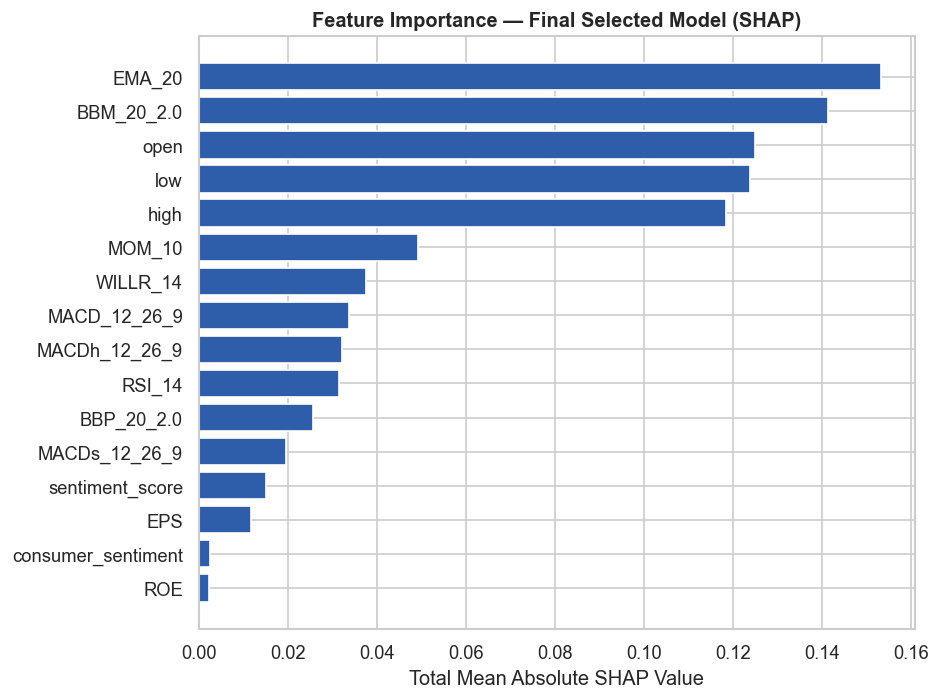

In [13]:
shap_model8_df = pd.read_csv(os.path.join(RESULTS_DIR, "shap_summary_model_LSTM_CNN.csv"))

overall_ranking_model8 = shap_model8_df.groupby('Feature')['Mean_SHAP_Value'].sum().sort_values(ascending=True)

fig, ax = plt.subplots(figsize=(8, 6))
ax.barh(overall_ranking_model8.index, overall_ranking_model8.values, color=PALETTE["primary"])
ax.set_title('Feature Importance — Final Selected Model (SHAP)')
ax.set_xlabel('Total Mean Absolute SHAP Value')
plt.tight_layout()
plt.savefig(os.path.join(PLOTS_DIR, 'top_features_final_model.png'))
plt.show()


**Section 3 takeaway:** SHAP analysis consistently ranks EMA_20 and BBM_20 as the most influential features for the proposed model, well ahead of macro and sentiment signals — confirming the model leans primarily on fast-adapting technical indicators rather than slower fundamental context. Ridge RFE selected a stable ~25-feature core for several tickers regardless of window size, suggesting the feature set itself, not just the model, generalizes across temporal framings.

## 4. Model Performance Comparison

Compares the proposed hybrid CNN–LSTM against standalone CNN and LSTM baselines, and against a separate baseline model, across all tickers and temporal windows.

### 4.1 Per-model metric plots across window sizes

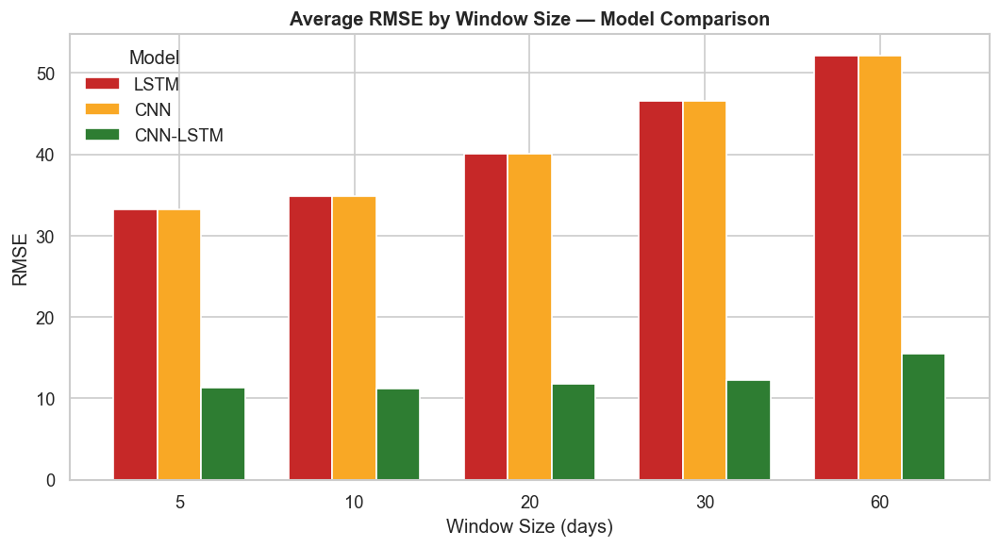

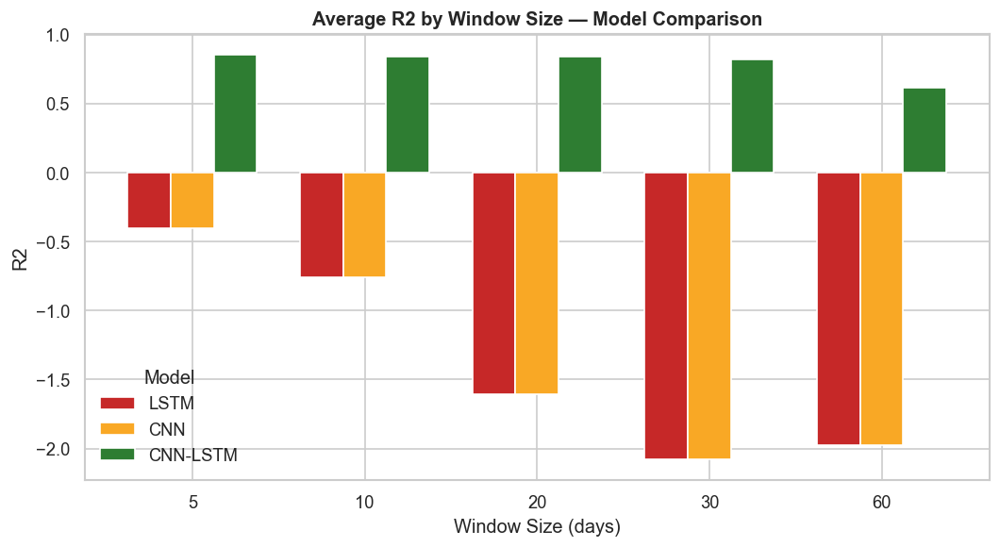

In [14]:
model_files = {
    'LSTM': os.path.join(RESULTS_DIR, 'model_lstm.json'),
    'CNN': os.path.join(RESULTS_DIR, 'model_cnn.json'),
    'CNN-LSTM': os.path.join(RESULTS_DIR, 'model_CNN_LSTM.json'),
}
metrics_to_plot = ['RMSE', 'R2']  # headline metrics — MAE/MAPE/Normalized RMSE tell a similar story

all_model_dfs = {}
for model_name, file_path in model_files.items():
    with open(file_path, 'r') as f:
        model_data = json.load(f)

    flat_data = []
    for ticker, windows in model_data.items():
        for window, metric_dict in windows.items():
            try:
                window = int(window)
            except ValueError:
                continue
            row = {'Ticker': ticker, 'Window': window}
            row.update(metric_dict)
            flat_data.append(row)

    all_model_dfs[model_name] = pd.DataFrame(flat_data)

# One clean grouped bar chart per metric, all 3 models side-by-side, averaged across tickers
for metric in metrics_to_plot:
    avg_by_window = pd.DataFrame({
        model_name: df.groupby('Window')[metric].mean()
        for model_name, df in all_model_dfs.items()
    }).sort_index()

    ax = avg_by_window.plot(
        kind='bar', figsize=(9, 5),
        color=[PALETTE["models"].get(m, PALETTE["primary"]) for m in avg_by_window.columns],
        width=0.75
    )
    ax.set_title(f'Average {metric} by Window Size — Model Comparison')
    ax.set_xlabel('Window Size (days)')
    ax.set_ylabel(metric)
    ax.legend(title='Model', frameon=False)
    ax.tick_params(axis='x', rotation=0)
    plt.tight_layout()
    plt.savefig(os.path.join(PLOTS_DIR, f'model_comparison_{metric.lower()}.png'))
    plt.show()
    plt.close()

df_lstm, df_cnn, df_cnn_lstm = all_model_dfs['LSTM'], all_model_dfs['CNN'], all_model_dfs['CNN-LSTM']


### 4.2 Overall model comparison table

In [15]:
# df_lstm, df_cnn, df_cnn_lstm were already built in Section 4.1 above.
# (Removed here: an earlier duplicate reload, and a "Baseline" model comparison
# that used a differently-scoped results file and isn't part of this comparison.)


In [16]:
metric_cols = ['RMSE', 'MAE', 'MAPE', 'R2']

avg_overall_lstm = df_lstm[metric_cols].mean().to_frame(name='LSTM').T
avg_overall_cnn = df_cnn[metric_cols].mean().to_frame(name='CNN').T
avg_overall_cnn_lstm = df_cnn_lstm[metric_cols].mean().to_frame(name='Proposed CNN-LSTM').T

df_avg_overall_all_models = pd.concat([avg_overall_lstm, avg_overall_cnn, avg_overall_cnn_lstm])
df_avg_overall_all_models.index.name = 'Model'

df_avg_per_window_lstm = df_lstm.groupby('Window')[metric_cols].mean().reset_index()
df_avg_per_window_cnn = df_cnn.groupby('Window')[metric_cols].mean().reset_index()
df_avg_per_window_cnn_lstm = df_cnn_lstm.groupby('Window')[metric_cols].mean().reset_index()

df_avg_overall_all_models


,RMSE,MAE,MAPE,R2
Model,,,,
LSTM,41.387643,37.699845,12.520643,-1.365126
CNN,41.387643,37.699845,12.520643,-1.365126
Proposed CNN-LSTM,12.393957,9.469683,3.478657,0.794232


### 4.3 Proposed model — average performance by window size

In [17]:
df_avg_per_window_cnn_lstm['Window'] = df_avg_per_window_cnn_lstm['Window'].astype(int)
df_avg_per_window_cnn_lstm.sort_values(by='Window', ascending=True)


,Window,RMSE,MAE,MAPE,R2
0,5,11.313639,8.386404,3.070785,0.855423
1,10,11.149947,8.242274,3.149986,0.840888
2,20,11.801401,8.942570,3.278342,0.839833
3,30,12.242075,9.451999,3.427908,0.819434
4,60,15.462720,12.325167,4.466262,0.615583


**Section 4 takeaway:** The proposed CNN–LSTM outperforms both standalone baselines across every window size, not just on average — RMSE drops by roughly two-thirds and R² moves from negative (worse than predicting the mean) to consistently above 0.6. The gap is largest at shorter windows (5–10 days), which is also where the proposed model achieves its best absolute performance, reinforcing that the hybrid architecture and the shorter-window setting are complementary rather than independent findings.

## 5. Per-Ticker Deep Dive (Proposed CNN–LSTM)

Full metric breakdown by window size for the tickers discussed in the write-up (AMD, NVDA, NFLX, BA), illustrating the asset-specific optimal-window behavior.

In [18]:
df_amd = df_cnn_lstm[df_cnn_lstm['Ticker'] == 'AMD.US'].drop(columns=['Normalized RMSE'])
df_amd


,Ticker,Window,RMSE,MAE,MAPE,R2
30,AMD.US,5,6.703504,5.211814,3.951957,0.925201
31,AMD.US,10,6.856795,5.272412,4.004177,0.921833
32,AMD.US,20,6.666523,5.157899,3.902384,0.926063
33,AMD.US,30,6.663032,5.183773,3.917321,0.925838
34,AMD.US,60,6.951283,5.426709,4.054590,0.918464


In [19]:
df_nvda = df_cnn_lstm[df_cnn_lstm['Ticker'] == 'NVDA.US'].drop(columns=['Normalized RMSE'])
df_nvda


,Ticker,Window,RMSE,MAE,MAPE,R2
40,NVDA.US,5,7.032982,5.628076,4.592858,0.757321
41,NVDA.US,10,9.087654,6.914031,5.729278,0.587711
42,NVDA.US,20,8.265527,6.401556,5.305637,0.654110
43,NVDA.US,30,9.588856,8.262167,6.528206,0.519174
44,NVDA.US,60,20.872519,19.191159,14.834545,-1.402746


In [20]:
df_nflx = df_cnn_lstm[df_cnn_lstm['Ticker'] == 'NFLX.US'].drop(columns=['Normalized RMSE'])
df_nflx


,Ticker,Window,RMSE,MAE,MAPE,R2
10,NFLX.US,5,34.820035,25.270421,2.745343,0.967525
11,NFLX.US,10,29.934630,21.433736,2.402729,0.975941
12,NFLX.US,20,32.619375,23.280382,2.599476,0.971361
13,NFLX.US,30,32.811063,23.757457,2.631327,0.970879
14,NFLX.US,60,48.295850,36.261328,3.867050,0.936544


In [21]:
df_ba = df_cnn_lstm[df_cnn_lstm['Ticker'] == 'BA.US'].drop(columns=['Normalized RMSE'])
df_ba


,Ticker,Window,RMSE,MAE,MAPE,R2
0,BA.US,5,6.783063,5.174951,3.028460,0.847608
1,BA.US,10,6.135537,4.732507,2.764125,0.875678
2,BA.US,20,6.803542,5.416427,3.191431,0.847654
3,BA.US,30,6.491853,5.096736,2.998088,0.861915
4,BA.US,60,6.089490,4.700540,2.764885,0.879564


### 5.1 Best-performing tickers at window = 10 (ranked by R²)

In [22]:
df_cnn_lstm['Window'] = pd.to_numeric(df_cnn_lstm['Window'], errors='coerce')
df_cnn_lstm_w10 = df_cnn_lstm[df_cnn_lstm['Window'] == 10].copy()
df_cnn_lstm_w10_sorted = df_cnn_lstm_w10.sort_values(by='R2', ascending=False)
df_cnn_lstm_w10_sorted


,Ticker,Window,RMSE,MAE,MAPE,R2,Normalized RMSE
11,NFLX.US,10,29.934630,21.433736,2.402729,0.975941,22.531210
51,TSLA.US,10,20.176931,14.989226,5.254389,0.927141,29.654566
31,AMD.US,10,6.856795,5.272412,4.004177,0.921833,8.457182
26,GS.US,10,18.772603,12.843443,2.356707,0.917549,11.890761
1,BA.US,10,6.135537,4.732507,2.764125,0.875678,26.244194
46,PFE.US,10,0.655033,0.508189,2.079086,0.860679,4.491454
21,MSFT.US,10,11.176123,8.893274,2.104951,0.823800,8.258180
16,AAPL.US,10,7.264271,5.385222,2.485692,0.812585,5.648290
6,GOOG.US,10,5.568996,4.434668,2.550779,0.800432,4.515729
36,ABBV.US,10,7.020847,5.258305,2.917933,0.746419,5.584968


## Conclusions

**1. The hybrid CNN–LSTM's advantage is consistent and large, not marginal.** Across every window size (5–60 days), the proposed model holds R² in the 0.6–0.85 range while both standalone baselines sit at R² between -0.4 and -2.1 — meaning the baselines perform *worse than simply predicting the historical mean*, while the hybrid model explains the large majority of price variance. RMSE tells the same story: the proposed model stays flat around 11–15 across all windows, while the baselines climb steadily from ~33 to ~52 as window size grows. This isn't a small edge — it's the difference between a usable model and a non-functional one.

**2. Raw correlation and SHAP importance disagree sharply — and that disagreement is itself a finding.** PE_ratio, WILLR_14, and the stochastic oscillators (STOCHK_14, STOCHD_14) show *near-zero* linear correlation with adjusted close (all under 0.05, see "Overall Feature Correlation with Adjusted Close"), yet PE_ratio and WILLR_14 rank as the **top two most important features by SHAP** in the same model. This means the model is learning a genuinely non-linear relationship that a simple correlation-based feature selection would have discarded entirely — a concrete justification for using SHAP (post-hoc, model-aware) rather than correlation (pre-hoc, linear-only) to judge feature relevance.

**3. Macro variables' high correlation with price is likely a trend artifact, not a real signal.** For AAPL specifically, GDP and CPI show 0.93–0.99 correlation with price-level features (open, high, low, moving averages) — but this is almost certainly because both AAPL's price and U.S. GDP/CPI trended upward over 2018–2025, not because GDP mechanically drives AAPL's stock price day to day. This is a classic non-stationarity trap in financial correlation analysis, and it's worth being explicit about this limitation rather than overstating the macro features' causal relevance.

**4. Heavy multicollinearity among engineered price features justified the feature-selection step.** The "Top 9 Most Correlated Features" heatmap for AAPL shows open/high/low/moving-averages/Bollinger-Bands all correlated at 0.99–1.00 with each other — they carry almost no independent information. This confirms Ridge RFE was doing real work by trimming this redundancy rather than just reducing dimensionality for its own sake.

**5. Sentiment is weakly correlated but not unimportant.** `sentiment_score` shows only ~0.13 raw correlation with price and is visually the palest cell in the full AAPL correlation heatmap — yet it still appears consistently, if modestly, in the SHAP rankings across windows. This is consistent with sentiment being a *conditional* signal (useful in combination with other features or during specific regimes) rather than a features with a strong standalone linear effect — exactly the kind of interaction a tree/SHAP-based analysis can surface but a correlation table cannot.

**6. Company-level price histories are genuinely heterogeneous, which supports the asset-specific window finding.** BA shows a sharp 2019–2020 regime break and never fully recovers its pre-crash trend; NVDA and NFLX show explosive, compounding 2023–2025 growth; AAPL, MSFT, and GOOG show steadier, lower-volatility compounding throughout. Given how differently these price series actually behave, it is unsurprising — in hindsight — that no single temporal window length was optimal across all of them.

**Practical takeaway:** for anyone extending this work, the biggest lesson is methodological rather than architectural — SHAP-based feature importance and correlation analysis can disagree substantially, and treating correlation as a proxy for "what the model will find useful" would have led to discarding some of the most predictive features (PE_ratio, WILLR_14) in this study.
